### PACE Rapid Response Notebook - for workshopping workflow

To Do:
- adapt hackweek code to pull pace data for a given product, lat/lon extent, and time range defined before and after an event of interest
- spatially bin l2 data consistently?
- Make a mask of only pixels present both datasets (to prevent bias), compare data w/ pretty maps

In [1]:
import cartopy.crs as ccrs
import earthaccess
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import os
import cmocean
import imageio
import glob
import re
import cf_xarray as cf
import matplotlib.dates as mdates
import matplotlib.colors as mcolors
import pandas as pd
from matplotlib.colors import LogNorm
from scipy.interpolate import griddata
from dask.distributed import Client
from matplotlib.patches import Rectangle
from PIL import Image, ImageEnhance
from io import BytesIO
from IPython.display import Image as IM
from collections import defaultdict
from matplotlib.colors import ListedColormap

### Development test-case
Hurricane Erin, look at chl-a before and after hurricane for
Timeline (using worldview): 
- Hurricane off florida/gulf stream PACE imagery on AUG 20
- AUG 21, hurricane passed and clear imagery
- Aug 18/19 hurricane not there yet

Lat/Lon bounds: 
UL: 32.09, -76.63 
LR: 27.78, -77.80


### Workflow
- use a datapoint in the center of AOI and time bounds/ earthaccess search to determine a granule form which we will define our L3M-like grid (see dask_gridding tutorial notebook)
- define crs, tramsform, shape from this L3M-like granule (chla_L3M_aoi in dask_griddding.ipynb notebook from hackweek)
- do another earthdata search, for full AOI over time period (1 week ish pre hurricane)
- open all and calculate average of parameter (in this case chl-a) using dask (follow dask_griddding.ipynb section 4)
- repeat above with timespan post hurricane, using same crs, tramsform, shape for gridding
- at this point, have pre and post hurricane chl averages on same spatial grid. now, mask each for pixels that have date pre and post hurricane
- make graphic showing before/after. Calculate average pre and post (using mask to avoid bias) and calculate a % increase in chl-a


In [2]:
# Newer workflow - test making the geographic parameter and dask steps functions

# all functions initilized here:

# Define Functions, don't modify
def mask_ds(ds, flags=None, mask_reverse=False):
    """
    Mask for a PACE dataset for one or multiple L2 flags using cf_xarray.
    Default is to mask clouds ("CLDICE").
    
    Args:
        ds - xarray dataset containing "l2_flags" variable.
        flags - List of L2 flags to mask for (e.g., ["CLDICE", "STRAYLIGHT"]).
                If None, defaults to ["CLDICE"].
        mask_reverse - If True, keep only pixels with the desired flags. Default is False.
                       E.g., use the "LAND" flag to mask water pixels.
    
    Returns:
        Masked dataset.
    """
    if flags is None:
        flags = ["CLDICE"]  # Default to masking clouds if no flags are provided

    print(ds)
    # Check if cf_xarray recognizes l2_flags
    if ds["l2_flags"].cf.is_flag_variable:
        # Combine masks for all flags
        combined_mask = None
        for flag in flags:
            flag_mask = ds["l2_flags"].cf == flag
            if combined_mask is None:
                combined_mask = flag_mask
            else:
                combined_mask |= flag_mask  # Combine masks with OR logic

        # Apply the combined mask
        if mask_reverse:
            return ds.where(combined_mask)
        else:
            return ds.where(~combined_mask)
    else:
        raise ValueError("The 'l2_flags' variable is not recognized as a flag variable by cf_xarray.")


def grid_match(path, dst_crs, dst_shape, dst_transform, variable):
    """Reproject a Level-2 granule to match a Level-3M-ish granule."""
    dt = xr.open_datatree(path,decode_timedelta=True)
    #ds = xr.merge(dt.to_dict().values())#
    #ds = ds.set_coords(("longitude", "latitude")) # Set longitude and latitude as coordinates
    #ds = mask_ds(ds, flags=["CLDICE", "STRAYLIGHT", "TURBIDW", "LAND"])#
    #print("MAde it past mask")#
    da = dt["geophysical_data"][variable]
    # print(da)
    da = da.rio.set_spatial_dims("pixels_per_line", "number_of_lines")
    da = da.rio.write_crs("epsg:4326")
    da = da.rio.reproject(
        dst_crs,
        shape=dst_shape,
        transform=dst_transform,
        src_geoloc_array=(
            dt["navigation_data"]["longitude"],
            dt["navigation_data"]["latitude"],
        ),
    )
    da = da.rename({"x":"longitude", "y":"latitude"})
    return da

def grid_match_SREF(path, dst_crs, dst_shape, dst_transform, variable):
    """Reproject a Level-2 granule to match a Level-3M-ish granule."""
    dt = xr.open_datatree(path)
    da = dt["geophysical_data"][variable]
    #da = da.isel(pixels_per_line=slice(13,None))
    #da = da.assign_coords(wavelength_3d=dt["geophysical_data"]["wavelength"].values)
    da = da.transpose('wavelength_3d', 'number_of_lines', 'pixels_per_line')
    da = da.rio.set_spatial_dims("pixels_per_line", "number_of_lines")
    da = da.rio.write_crs("epsg:4326")
    da = da.rio.reproject(
        dst_crs,
        shape=dst_shape,
        transform=dst_transform,
        src_geoloc_array=(
            dt["navigation_data"]["longitude"],
            dt["navigation_data"]["latitude"],
        ),
    )
    da = da.rename({"x":"longitude", "y":"latitude"})

    # # Regrid tilt to the new grid
    # orig_lon = dt["navigation_data"]["longitude"].values
    # orig_lat = dt["navigation_data"]["latitude"].values
    # orig_tilt = dt["navigation_data"]["tilt"].values

    # # Broadcast tilt to match the shape of longitude/latitude if needed
    # if orig_tilt.ndim == 1 and orig_lon.shape != orig_tilt.shape:
    #     orig_tilt = np.broadcast_to(orig_tilt[:, None], orig_lon.shape)

    # points = np.column_stack((orig_lon.ravel(), orig_lat.ravel()))
    # values = orig_tilt.ravel()

    # # Get the new grid from the reprojected DataArray
    # new_lon = da["longitude"].values
    # new_lat = da["latitude"].values

    # # If new_lon/new_lat are 2D, flatten for griddata, then reshape after
    # if new_lon.ndim == 2 and new_lat.ndim == 2:
    #     new_points = np.column_stack((new_lon.ravel(), new_lat.ravel()))
    #     tilt_regridded = griddata(points, values, new_points, method='nearest')
    #     tilt_regridded = tilt_regridded.reshape(new_lon.shape)
    #     da = da.assign_coords(tilt=(('latitude', 'longitude'), tilt_regridded))
    # else:
    #     # If 1D, meshgrid and flatten
    #     lon_grid, lat_grid = np.meshgrid(new_lon, new_lat)
    #     new_points = np.column_stack((lon_grid.ravel(), lat_grid.ravel()))
    #     tilt_regridded = griddata(points, values, new_points, method='nearest')
    #     tilt_regridded = tilt_regridded.reshape(lon_grid.shape)
    #     da = da.assign_coords(tilt=(('latitude', 'longitude'), tilt_regridded))

    return da

def time_from_attr(ds):
    """Set the start time attribute as a dataset variable.
 
    Parameters
    ----------
    ds
        a dataset corresponding to a Level-2 granule
    """
    datetime = ds.attrs["time_coverage_start"].replace("Z", "")
    ds["time"] = ((), np.datetime64(datetime, "ns"))
    ds = ds.set_coords("time")
    return ds

def load_first(path, var):
    '''Load the first file returned in earthdata search, then manipulate to L3M-like, and
       store the crs, shape, and transform to make opening all the search result granules fast'''
    datatree = xr.open_datatree(path)
    dataset = xr.merge(datatree.to_dict().values())
    dataset = dataset.set_coords(("longitude", "latitude"))

    var_data = dataset[var]# use code from dask_gridding notebook to transform L2 granule to L3M-like grid
    var_data = var_data.rio.set_spatial_dims("pixels_per_line", "number_of_lines")
    var_data = var_data.rio.write_crs("epsg:4326")
    var_L3M = var_data.rio.reproject(
        dst_crs="epsg:4326",
        src_geoloc_array=(
            var_data.coords["longitude"],
            var_data.coords["latitude"],
        ),
    )
    var_L3M = var_L3M.rename({"x":"longitude", "y":"latitude"})

    #var_L3M_aoi = var_L3M.sel({"longitude": slice(bbox[0], bbox[2]),"latitude": slice(bbox[3], bbox[1])})

    # Try to extend to bounding box
    var_L3M_aoi = var_L3M.rio.pad_box(
        minx=bbox[0],
        miny=bbox[1],
        maxx=bbox[2],
        maxy=bbox[3],
        constant_values=np.nan
    )

    crs = var_L3M_aoi.rio.crs# set mapping parameters from newly transformed file, to use when opening the rest with dask
    shape = var_L3M_aoi.rio.shape
    transform = var_L3M_aoi.rio.transform()

    return crs, shape, transform

def load_first_SREF(path, var):
    '''Load the first file returned in earthdata search, then manipulate to L3M-like, and
       store the crs, shape, and transform to make opening all the search result granules fast'''
    datatree = xr.open_datatree(path)
    dataset = xr.merge(datatree.to_dict().values())
    dataset = dataset.isel(pixels_per_line=slice(13,None))
    dataset = dataset.set_coords(("longitude", "latitude"))
    print(dataset[var].coords)

    var_data = dataset[var]# use code from dask_gridding notebook to transform L2 granule to L3M-like grid
    var_data = var_data.transpose('wavelength_3d', 'number_of_lines', 'pixels_per_line')
    var_data = var_data.rio.set_spatial_dims("pixels_per_line", "number_of_lines")

    var_data = var_data.rio.write_crs("epsg:4326")
    var_L3M = var_data.rio.reproject(
        dst_crs="epsg:4326",
        src_geoloc_array=(
            var_data.coords["longitude"],
            var_data.coords["latitude"],
        ),
    )
    var_L3M = var_L3M.rename({"x":"longitude", "y":"latitude"})

    # Try to extend to bounding box
    var_L3M_aoi = var_L3M.rio.pad_box(
        minx=bbox[0],
        miny=bbox[1],
        maxx=bbox[2],
        maxy=bbox[3],
        constant_values=np.nan
    )


    #var_L3M_aoi = var_L3M.sel({"longitude": slice(bbox[0], bbox[2]),"latitude": slice(bbox[3], bbox[1])})

    #print the minimum and maximum lognitude and latitude coords to check
    # print(var_L3M_aoi.longitude.min().values, var_L3M_aoi.longitude.max().values)
    # print(var_L3M_aoi.latitude.min().values, var_L3M_aoi.latitude.max().values)

    crs = var_L3M_aoi.rio.crs# set mapping parameters from newly transformed file, to use when opening the rest with dask
    shape = var_L3M_aoi.rio.shape 
    wl = var_L3M_aoi['wavelength_3d']
    transform = var_L3M_aoi.rio.transform()

    return crs, shape, transform, wl

def coregister_granules(paths, crs, shape, transform, var_name):
    ''' Use geographic parameters returned from load_first function to open all the granules for a given "paths" 
        Variable returned by earthdata search. returns an xarray dataset, where the time dimension differentiates
        data from each different granule
    
    '''

    client = Client()
    futures = client.map(grid_match,paths,dst_crs=crs,dst_shape=shape,dst_transform=transform, variable = var_name)
    kwargs = {"combine": "nested", "concat_dim": "time"}
    attrs = xr.open_mfdataset(paths, preprocess=time_from_attr, **kwargs)
    data = xr.combine_nested(client.gather(futures), concat_dim="time")# open all pre files. they are stored in same xarray dataset at different "time" coordinates 
    data["time"] = attrs["time"]
    client.close()
    print('loaded pre event files')

    return data

def coregister_granules_SREF(paths, crs, shape, transform, var_name):
    ''' Use geographic parameters returned from load_first function to open all the granules for a given "paths" 
        Variable returned by earthdata search. returns an xarray dataset, where the time dimension differentiates
        data from each different granule
    
    '''

    client = Client()
    futures = client.map(grid_match_SREF,paths,dst_crs=crs,dst_shape=shape,dst_transform=transform, variable = var_name)
    kwargs = {"combine": "nested", "concat_dim": "time"}
    attrs = xr.open_mfdataset(paths, preprocess=time_from_attr, **kwargs)
    data = xr.combine_nested(client.gather(futures), concat_dim="time")# open all pre files. they are stored in same xarray dataset at different "time" coordinates 
    data["time"] = attrs["time"]
    client.close()
    print('loaded pre event files')

    return data

def enhance(rgb, scale = 0.01, vmin = 0.01, vmax = 1.04, gamma=0.95, contrast=1.2, brightness=1.1, sharpness=2, saturation=1.1):
    """The SeaDAS recipe for RGB images from Ocean Color missions.

    Args:
        rgb: a data array with three dimensions, having 3 or 4 bands in the third dimension
        scale: scale value for the log transform
        vmin: minimum pixel value for the image
        vmax: maximum pixel value for the image
        gamma: exponential factor for gamma correction
        contrast: amount of pixel value differentiation 
        brightness: pixel values (intensity)
        sharpness: amount of detail
        saturation: color intensity

    Returns:
       a transformed data array better for RGB display
    """
    rgb = rgb.where(rgb > 0)
    rgb = np.log(rgb / scale) / np.log(1 / scale)
    rgb = rgb.where(rgb >= vmin, vmin)
    rgb = rgb.where(rgb <= vmax, vmax)    
    rgb_min = rgb.min(("latitude", "longitude"))
    rgb_max = rgb.max(("latitude", "longitude"))
    rgb = (rgb - rgb_min) / (rgb_max - rgb_min)
    rgb = rgb * gamma
    img = rgb * 255
    img = img.where(img.notnull(), 0).astype("uint8")
    img = Image.fromarray(img.data)
    enhancer = ImageEnhance.Contrast(img)
    img = enhancer.enhance(contrast)
    enhancer = ImageEnhance.Brightness(img)
    img = enhancer.enhance(brightness)
    enhancer = ImageEnhance.Sharpness(img)
    img = enhancer.enhance(sharpness)
    enhancer = ImageEnhance.Color(img)
    img = enhancer.enhance(saturation)
    rgb[:] = np.array(img) / 255
    return rgb

def quick_plot_sref_1band(data_slice):
    """Quick plot function for a single band from SREF data
    """

    fig, ax = plt.subplots(figsize=(5, 4), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
    plot = data_slice.sel(wavelength_3d=443, method='nearest').plot(
        x="longitude", y="latitude",
        cbar_kwargs={'label': 'rhos(443) [sr^-1]', 'shrink': 0.5},
        cmap=cmocean.cm.haline,
        norm=LogNorm(vmin=.001, vmax=0.1),
        ax=ax,
        robust=True
    )
    ax.set_xlim(bbox[0]-3, bbox[2]+3)
    ax.set_ylim(bbox[1]-3, bbox[3]+3)
    ax.coastlines()
    #ax.set_title(f'Granule {i+1} - Time: {str(data_slice.time.values)[:19]} - 443 nm')
    plt.show()

# def mask_ds(ds, flags=None, mask_reverse=False):
#     """
#     Mask for a PACE dataset for one or multiple L2 flags using cf_xarray.
#     Default is to mask clouds ("CLDICE").
    
#     Args:
#         ds - xarray dataset containing "l2_flags" variable.
#         flags - List of L2 flags to mask for (e.g., ["CLDICE", "STRAYLIGHT"]).
#                 If None, defaults to ["CLDICE"].
#         mask_reverse - If True, keep only pixels with the desired flags. Default is False.
#                        E.g., use the "LAND" flag to mask water pixels.
    
#     Returns:
#         Masked dataset.
#     """
#     if flags is None:
#         flags = ["CLDICE"]  # Default to masking clouds if no flags are provided

#     # Check if cf_xarray recognizes l2_flags
#     if ds["l2_flags"].cf.is_flag_variable:
#         # Combine masks for all flags
#         combined_mask = None
#         for flag in flags:
#             flag_mask = ds["l2_flags"].cf == flag
#             if combined_mask is None:
#                 combined_mask = flag_mask
#             else:
#                 combined_mask |= flag_mask  # Combine masks with OR logic

#         # Apply the combined mask
#         if mask_reverse:
#             return ds.where(combined_mask)
#         else:
#             return ds.where(~combined_mask)
#     else:
#         raise ValueError("The 'l2_flags' variable is not recognized as a flag variable by cf_xarray.")

def download_from_results(results, localpath):
    path = earthaccess.download(results, local_path=localpath)
    dt = xr.open_datatree(path[0], decode_timedelta=True) # Open the downloaded data as an xarray DataTree
    ds = xr.merge(dt.to_dict().values()) # Merge all datasets in the DataTree into a single xarray Dataset
    ds = ds.set_coords(("longitude", "latitude")) # Set longitude and latitude as coordinates

    return ds

#chat gpt
def grid_match2(path, dst_crs, dst_shape, dst_transform, variable):
    """Reproject a Level-2 granule to match a Level-3M-ish granule."""
    print(dst_crs)
    dt = xr.open_datatree(path)
    
    # Get individual DataArrays
    da1 = dt["geophysical_data"][variable]
    da2 = dt["geophysical_data"]['l2_flags']
    
    # Process each DataArray separately
    def process_dataarray(da):
        da = da.rio.set_spatial_dims("pixels_per_line", "number_of_lines")
        da = da.rio.set_crs("epsg:4326")
        da = da.rio.reproject(
            dst_crs,
            shape=dst_shape,
            transform=dst_transform,
            src_geoloc_array=(
                dt["navigation_data"]["longitude"],
                dt["navigation_data"]["latitude"],
            ),
        )
        da = da.rename({"x":"longitude", "y":"latitude"})
        return da
    
    # Process both DataArrays
    da1_reprojected = process_dataarray(da1)
    da2_reprojected = process_dataarray(da2)
    
    # Merge after reprojection
    result = xr.merge([da1_reprojected, da2_reprojected])
    result = mask_ds(result,flags=["LAND"])

    return result

In [3]:
# User definitions:

pre_tspan = ("2025-08-15", "2025-08-19")    # define your pre-event and post-event timespans
post_tspan = ("2025-08-21", "2025-08-22")
post_post_tspan = ("2025-08-24", "2025-09-05") # in case you want to look at a longer post-event period

min_lon = -82       # Set lat/lon extent for area of interest
min_lat = 25 
max_lon = -63
max_lat = 33

# OCI suite and variable of interest within a particular suite
suite_name="PACE_OCI_L2_BGC_NRT" # shortname of the suite, e.g. For PACE: PACE_OCI_L2_BGC_NRT, PACE_OCI_L2_AOP_NRT, etc. (plan to add more to this comment)
var_name = "chlor_a" # variable of interest

in_the_cloud = False # set to true if running in cloud (e.g. Cryocloud), false if running locally. For speed, granules will be downloaded to a local_data directory when set to false

In [4]:
# Perform the earthdata search:
bbox = (min_lon, min_lat, max_lon, max_lat)

pre_results = earthaccess.search_data(
    short_name=suite_name,
    temporal=pre_tspan,
    bounding_box=bbox,
)
print(" Number of pre-event granules: "+str(len(pre_results)))

post_results = earthaccess.search_data(
    short_name=suite_name,
    temporal=post_tspan,
    bounding_box=bbox,
)
print(" Number of post-event granules: "+str(len(post_results)))

post_post_results = earthaccess.search_data(
    short_name=suite_name,
    temporal=post_post_tspan,
    bounding_box=bbox,
)
print(" Number of post-event granules: "+str(len(post_results)))

# if not in the cloud, make a folder to downlad granules to. This folder is configured in the .gitignore to not be tracked
if in_the_cloud == False:
    os.makedirs('local_data/', exist_ok=True)

# in running this script in the cloud, earthaccess.open is fast, but when running locally it takes a long time (10+ min), and locally downloading the data is faster.
# so, get the data with different approaches, depening on whether you are in the cloud or not, defined above
if in_the_cloud == True:
    pre_paths = earthaccess.open(pre_results)
    post_paths = earthaccess.open(post_results)
    post_post_path = earthaccess.open(post_post_results)
else:
    pre_paths = earthaccess.download(pre_results, local_path="local_data/")
    post_paths = earthaccess.download(post_results, local_path="local_data/")
    post_post_paths = earthaccess.download(post_post_results, local_path="local_data/")
    print('Files Downloaded')



 Number of pre-event granules: 11
 Number of post-event granules: 5
 Number of post-event granules: 5


QUEUEING TASKS | :   0%|          | 0/11 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/11 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/11 [00:00<?, ?it/s]

QUEUEING TASKS | :   0%|          | 0/5 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/5 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/5 [00:00<?, ?it/s]

QUEUEING TASKS | :   0%|          | 0/44 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/44 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/44 [00:00<?, ?it/s]

Files Downloaded


In [5]:
# extract the geospatial characteristics from the first file in paths using 1-line function
# This cell is steps is parts 1, 2a, and 2b from previous workflow. functions clean things up nicely

crs, shape, transform = load_first(pre_paths[0], var_name)# once set, dont need to rerun for other vars in same suite

pre_data = coregister_granules(pre_paths, crs, shape, transform, var_name)
post_data = coregister_granules(post_paths, crs, shape, transform, var_name)
post_post_data = coregister_granules(post_post_paths, crs, shape, transform, var_name)

/var/folders/sv/8_g9kqw50y7d70sfnr2kqzzw0000gp/T/ipykernel_1845/4071404464.py:136: FutureWarning: In a future version, xarray will not decode the variable 'day' into a timedelta64 dtype based on the presence of a timedelta-like 'units' attribute by default. Instead it will rely on the presence of a timedelta64 'dtype' attribute, which is now xarray's default way of encoding timedelta64 values.
To continue decoding into a timedelta64 dtype, either set `decode_timedelta=True` when opening this dataset, or add the attribute `dtype='timedelta64[ns]'` to this variable on disk.
To opt-in to future behavior, set `decode_timedelta=False`.
  datatree = xr.open_datatree(path)
/var/folders/sv/8_g9kqw50y7d70sfnr2kqzzw0000gp/T/ipykernel_1845/4071404464.py:136: FutureWarning: In a future version, xarray will not decode the variable 'msec' into a timedelta64 dtype based on the presence of a timedelta-like 'units' attribute by default. Instead it will rely on the presence of a timedelta64 'dtype' attr

loaded pre event files


/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 51571 instead
  warnings.warn(


loaded pre event files


/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 51606 instead
  warnings.warn(


loaded pre event files


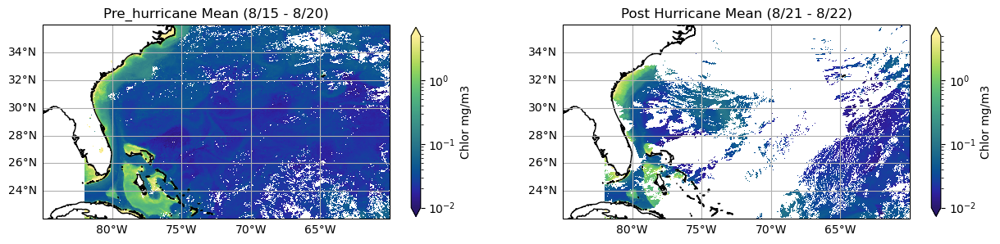

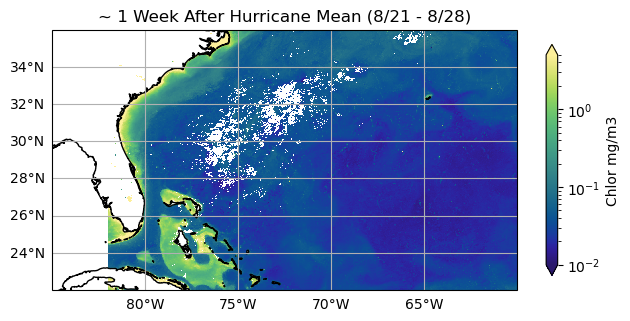

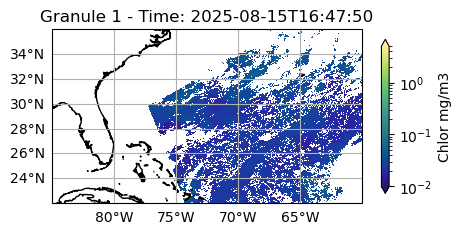

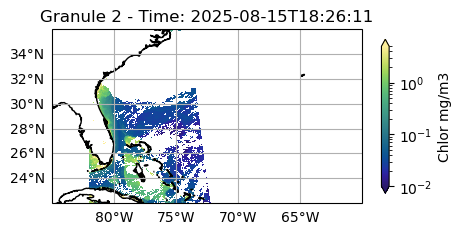

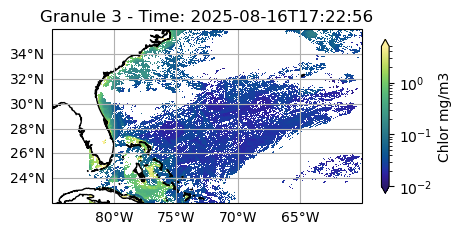

...

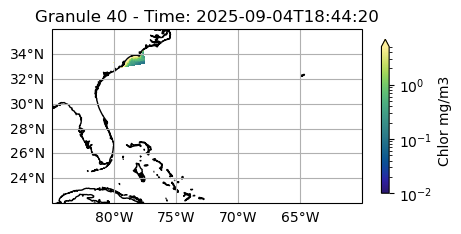

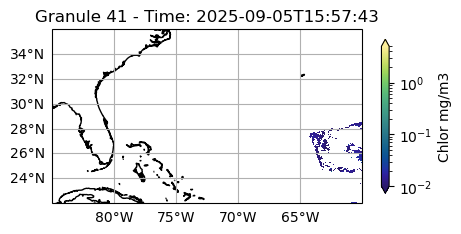

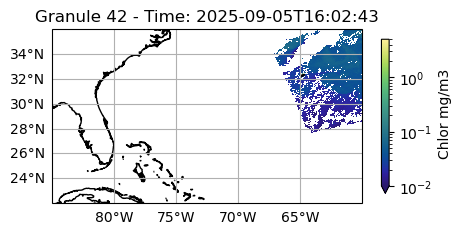

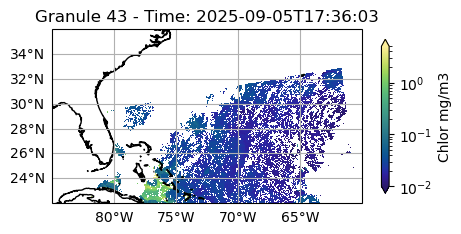

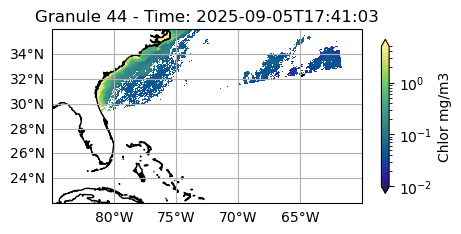

In [6]:
#fig, ax = plt.subplots(1, 2, figsize=(15, 6), subplot_kw={'projection': ccrs.PlateCarree()})
fig,ax = plt.subplots(1, 2, figsize=(15, 6), subplot_kw={'projection': ccrs.PlateCarree()})
ax[0].gridlines(draw_labels={"left": "y", "bottom": "x"})
plot = pre_data.mean("time").plot(x="longitude", y="latitude" , cbar_kwargs={'label': 'Chlor mg/m3', 'shrink':0.5}, cmap=cmocean.cm.haline,norm=LogNorm(vmin=.01, vmax=5),  ax=ax[0], robust=True)
ax[0].set_xlim(bbox[0]-3,bbox[2]+3)
ax[0].set_ylim(bbox[1]-3,bbox[3]+3)
ax[0].coastlines()
ax[0].set_title('Pre_hurricane Mean (8/15 - 8/20)')

ax[1].gridlines(draw_labels={"left": "y", "bottom": "x"})
plot = post_data.mean("time").plot(x="longitude", y="latitude", cbar_kwargs={'label': 'Chlor mg/m3', 'shrink':0.5}, cmap=cmocean.cm.haline,norm=LogNorm(vmin=.01, vmax=5),  ax=ax[1], robust=True)
ax[1].set_xlim(bbox[0]-3,bbox[2]+3)
ax[1].set_ylim(bbox[1]-3,bbox[3]+3)
ax[1].coastlines()
ax[1].set_title('Post Hurricane Mean (8/21 - 8/22)')

fig,ax = plt.subplots(1, 1, figsize=(7.5, 6), subplot_kw={'projection': ccrs.PlateCarree()})
ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
plot = post_post_data.mean("time").plot(x="longitude", y="latitude", cbar_kwargs={'label': 'Chlor mg/m3', 'shrink':0.5}, cmap=cmocean.cm.haline,norm=LogNorm(vmin=.01, vmax=5),  ax=ax, robust=True)
ax.set_xlim(bbox[0]-3,bbox[2]+3,)
ax.set_ylim(bbox[1]-3,bbox[3]+3)
ax.coastlines()
ax.set_title('~ 1 Week After Hurricane Mean (8/21 - 8/28)')

for i, data_slice in enumerate(pre_data):
    fig, ax = plt.subplots(figsize=(5, 4), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
    plot = data_slice.plot(
        x="longitude", y="latitude",
        cbar_kwargs={'label': 'Chlor mg/m3', 'shrink': 0.5},
        cmap=cmocean.cm.haline,
        norm=LogNorm(vmin=.01, vmax=5),
        ax=ax,
        robust=True
    )
    ax.set_xlim(bbox[0]-3, bbox[2]+3)
    ax.set_ylim(bbox[1]-3, bbox[3]+3)
    ax.coastlines()
    ax.set_title(f'Granule {i+1} - Time: {str(data_slice.time.values)[:19]}')
    plt.show()

for i, data_slice in enumerate(post_data):
    fig, ax = plt.subplots(figsize=(5, 4), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
    plot = data_slice.plot(
        x="longitude", y="latitude",
        cbar_kwargs={'label': 'Chlor mg/m3', 'shrink': 0.5},
        cmap=cmocean.cm.haline,
        norm=LogNorm(vmin=.01, vmax=5),
        ax=ax,
        robust=True
    )
    ax.set_xlim(bbox[0]-3, bbox[2]+3)
    ax.set_ylim(bbox[1]-3, bbox[3]+3)
    ax.coastlines()
    ax.set_title(f'Granule {i+1} - Time: {str(data_slice.time.values)[:19]}')
    plt.show()

for i, data_slice in enumerate(post_post_data):
    fig, ax = plt.subplots(figsize=(5, 4), subplot_kw={'projection': ccrs.PlateCarree()})
    ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
    plot = data_slice.plot(
        x="longitude", y="latitude",
        cbar_kwargs={'label': 'Chlor mg/m3', 'shrink': 0.5},
        cmap=cmocean.cm.haline,
        norm=LogNorm(vmin=.01, vmax=5),
        ax=ax,
        robust=True
    )
    ax.set_xlim(bbox[0]-3, bbox[2]+3)
    ax.set_ylim(bbox[1]-3, bbox[3]+3)
    ax.coastlines()
    ax.set_title(f'Granule {i+1} - Time: {str(data_slice.time.values)[:19]}')
    plt.show()


Text(0.5, 1.0, 'Percent Change in Chlorphyll-a')

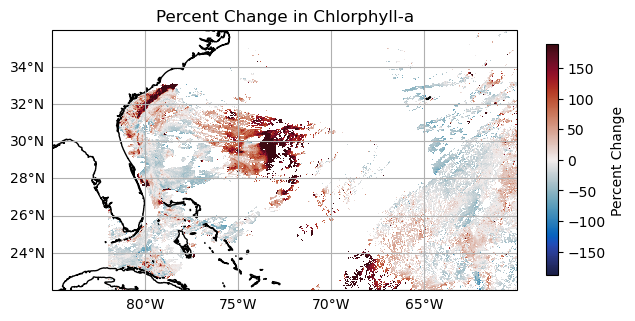

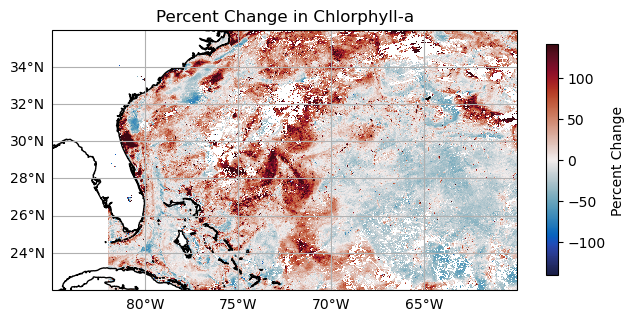

In [7]:
# compare the pre and post event data. first, mask both to only pixels where data is available before and after the hurricane
# then, mask each where it's values are greater or less than
pre_mean = pre_data.mean("time")
post_mean = post_data.mean("time")
post_post_mean = post_post_data.mean("time")

# Change mean values equal to zero to NaN, so they don't affect percent change calculations
# pre_mean = pre_mean.where(pre_mean != 0)
# post_mean = post_mean.where(post_mean != 0)
# post_post_mean = post_post_mean.where(post_post_mean != 0)

# post_mean['longitude'] = post_mean['longitude'].round(5)# round lat/lon to 5 decimals, was having issues with floats at large # of decimals not being exactly the same
# post_mean['latitude'] = post_mean['latitude'].round(5)
# pre_mean['longitude'] = pre_mean['longitude'].round(5)
# pre_mean['latitude'] = pre_mean['latitude'].round(5)
# post_post_mean['longitude'] = post_post_mean['longitude'].round(5)
# post_post_mean['latitude'] = post_post_mean['latitude'].round(5)

# Create a mask where both datasets have valid values
mask = ~np.isnan(post_mean) & ~np.isnan(pre_mean)
mask2 = ~np.isnan(post_post_mean) & ~np.isnan(pre_mean)

# Apply masks to datasets
pre_mean_mask = pre_mean.where(mask)
pre_mean_mask2 = pre_mean.where(mask2)
post_mean_mask = post_mean.where(mask)
post_post_mean_mask = post_post_mean.where(mask2)

post_greater = (post_mean_mask-pre_mean_mask)/pre_mean_mask * 100
post_post_greater = (post_post_mean_mask-pre_mean_mask2)/pre_mean_mask2 * 100

fig, ax = plt.subplots( figsize=(7.5, 6), subplot_kw={'projection': ccrs.PlateCarree()})
ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
plot = post_greater.plot(x="longitude", y="latitude" , cbar_kwargs={'label': 'Percent Change', 'shrink':0.5}, cmap=cmocean.cm.balance, extend = "neither", ax=ax, robust=True)
ax.set_xlim(bbox[0]-3,bbox[2]+3)
ax.set_ylim(bbox[1]-3,bbox[3]+3)
ax.coastlines()
ax.set_title('Percent Change in Chlorphyll-a')

fig, ax = plt.subplots( figsize=(7.5, 6), subplot_kw={'projection': ccrs.PlateCarree()})
ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
plot = post_post_greater.plot(x="longitude", y="latitude" , cbar_kwargs={'label': 'Percent Change', 'shrink':0.5}, cmap=cmocean.cm.balance, extend = "neither", ax=ax, robust=True)
ax.set_xlim(bbox[0]-3,bbox[2]+3)
ax.set_ylim(bbox[1]-3,bbox[3]+3)
ax.coastlines()
ax.set_title('Percent Change in Chlorphyll-a')

In [8]:
# Do the same analysis, but for AVW

pre_tspan = ("2025-08-15", "2025-08-20")    # define your pre-event and post-event timespans
post_tspan = ("2025-08-21", "2025-08-22")
post_post_tspan = ("2025-08-24", "2025-09-05") # in case you want to look at a longer post-event period

min_lon = -82       # Set lat/lon extent for area of interest
min_lat = 25 
max_lon = -63
max_lat = 33

suite_name="PACE_OCI_L2_AOP_NRT" # oci suite name
var_name = "avw" # variable of interest

in_the_cloud = False # set to true if crunning in cloud (e.g. Cryocloud), false if running locally. For speed, granules will be downloaded to a local_data directory when set to false

# do the earthdata search
bbox = (min_lon, min_lat, max_lon, max_lat)
if in_the_cloud == False:
    os.makedirs('local_data/', exist_ok=True)# if not in the cloud, make a folder to downlad granules to. This folder is configured in the .gitignore to not be tracked

pre_results = earthaccess.search_data(
    short_name=suite_name,
    temporal=pre_tspan,
    bounding_box=bbox,
)
print(" Number of pre-event granules: "+str(len(pre_results)))

post_results = earthaccess.search_data(
    short_name=suite_name,
    temporal=post_tspan,
    bounding_box=bbox,
)
print(" Number of post-event granules: "+str(len(post_results)))

post_post_results = earthaccess.search_data(
    short_name=suite_name,
    temporal=post_post_tspan,
    bounding_box=bbox,
)
print(" Number of post-post-event granules: "+str(len(post_results)))

# in running this script in the cloud, earthaccess.open is fast, but when running locally it takes a long time (10+ min), and locally downloading the data is faster.
# so, get the data with different approaches, depening on whether you are in the cloud or not, defined above
if in_the_cloud == True:
    pre_paths = earthaccess.open(pre_results)
    post_paths = earthaccess.open(post_results)
    post_post_paths = earthaccess.open(post_post_results)
else:
    pre_paths = earthaccess.download(pre_results, local_path="local_data/")
    post_paths = earthaccess.download(post_results, local_path="local_data/")
    post_post_paths = earthaccess.download(post_post_results, local_path="local_data/")
    print('Files Downloaded')

 Number of pre-event granules: 14
 Number of post-event granules: 5
 Number of post-post-event granules: 5


QUEUEING TASKS | :   0%|          | 0/14 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/14 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/14 [00:00<?, ?it/s]

QUEUEING TASKS | :   0%|          | 0/5 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/5 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/5 [00:00<?, ?it/s]

QUEUEING TASKS | :   0%|          | 0/44 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/44 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/44 [00:00<?, ?it/s]

Files Downloaded


In [9]:
# extract the geospatial characteristics from the first file in paths using 1-line function
# This cell is steps is parts 1, 2a, and 2b from previous workflow. functions clean things up nicely

crs, shape, transform = load_first(pre_paths[0], var_name)# once set, dont need to rerun for other vars in same suite

pre_data = coregister_granules(pre_paths, crs, shape, transform, var_name)
post_data = coregister_granules(post_paths, crs, shape, transform, var_name)
post_post_data = coregister_granules(post_post_paths, crs, shape, transform, var_name)


/var/folders/sv/8_g9kqw50y7d70sfnr2kqzzw0000gp/T/ipykernel_1845/4071404464.py:136: FutureWarning: In a future version, xarray will not decode the variable 'day' into a timedelta64 dtype based on the presence of a timedelta-like 'units' attribute by default. Instead it will rely on the presence of a timedelta64 'dtype' attribute, which is now xarray's default way of encoding timedelta64 values.
To continue decoding into a timedelta64 dtype, either set `decode_timedelta=True` when opening this dataset, or add the attribute `dtype='timedelta64[ns]'` to this variable on disk.
To opt-in to future behavior, set `decode_timedelta=False`.
  datatree = xr.open_datatree(path)
/var/folders/sv/8_g9kqw50y7d70sfnr2kqzzw0000gp/T/ipykernel_1845/4071404464.py:136: FutureWarning: In a future version, xarray will not decode the variable 'msec' into a timedelta64 dtype based on the presence of a timedelta-like 'units' attribute by default. Instead it will rely on the presence of a timedelta64 'dtype' attr

loaded pre event files


/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 51694 instead
  warnings.warn(


loaded pre event files


/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 51729 instead
  warnings.warn(


loaded pre event files


Text(0.5, 1.0, '~ 1 Week After Hurricane Mean (8/24 - 9/5)')

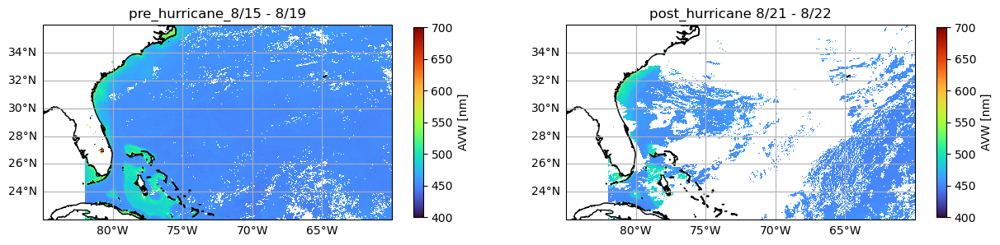

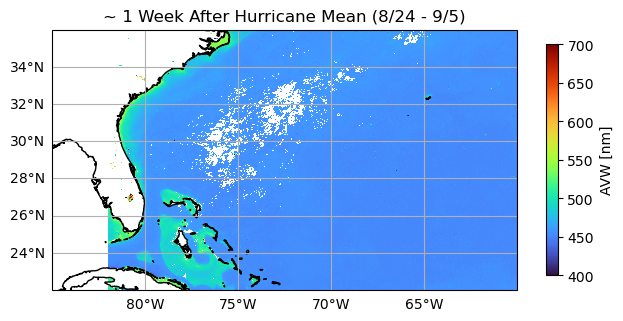

In [10]:
fig, ax = plt.subplots(1, 2, figsize=(15, 6), subplot_kw={'projection': ccrs.PlateCarree()})
ax[0].gridlines(draw_labels={"left": "y", "bottom": "x"})
plot = pre_data.mean("time").plot(x="longitude", y="latitude", extend="neither", cbar_kwargs={'label': 'AVW [nm]', 'shrink':0.5}, cmap="turbo", vmin=400, vmax=700, ax=ax[0], robust=True)
ax[0].set_xlim(bbox[0]-3,bbox[2]+3)
ax[0].set_ylim(bbox[1]-3,bbox[3]+3)
ax[0].coastlines()
ax[0].set_title('pre_hurricane_8/15 - 8/19')


ax[1].gridlines(draw_labels={"left": "y", "bottom": "x"})
plot = post_data.mean("time").plot(x="longitude", y="latitude", extend="neither", cbar_kwargs={'label': 'AVW [nm]', 'shrink':0.5}, cmap="turbo", vmin=400, vmax=700, ax=ax[1], robust=True)
ax[1].set_xlim(bbox[0]-3,bbox[2]+3)
ax[1].set_ylim(bbox[1]-3,bbox[3]+3)
ax[1].coastlines()
ax[1].set_title('post_hurricane 8/21 - 8/22')

fig,ax = plt.subplots(1, 1, figsize=(7.5, 6), subplot_kw={'projection': ccrs.PlateCarree()})
ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
plot = post_post_data.mean("time").plot(x="longitude", y="latitude", extend="neither", cbar_kwargs={'label': 'AVW [nm]', 'shrink':0.5}, cmap="turbo", vmin=400, vmax=700, ax=ax, robust=True)
ax.set_xlim(bbox[0]-3,bbox[2]+3,)
ax.set_ylim(bbox[1]-3,bbox[3]+3)
ax.coastlines()
ax.set_title('~ 1 Week After Hurricane Mean (8/24 - 9/5)')

Text(0.5, 1.0, 'Change in AVW')

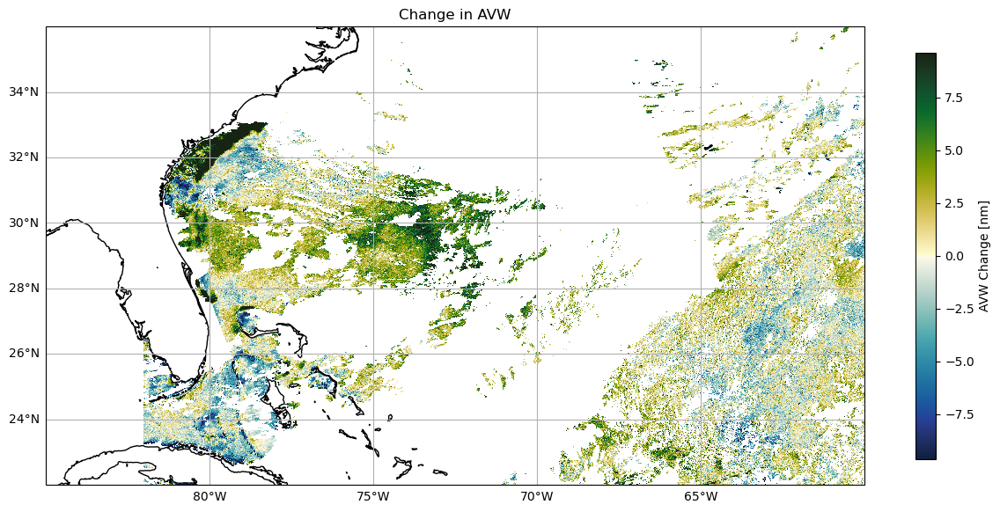

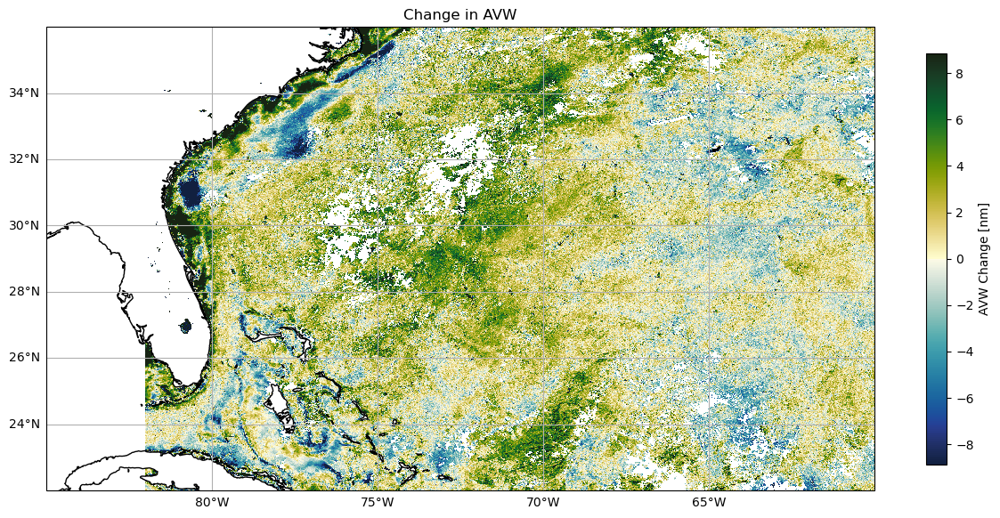

In [11]:
# compare the pre and post event data. first, mask both to only pixels where data is available before and after the hurricane
# then, mask each where it's values are greater or less than

pre_mean = pre_data.mean("time")
post_mean = post_data.mean("time")
post_post_mean = post_post_data.mean("time")

# post_mean['longitude'] = post_mean['longitude'].round(5)# round lat/lon to 5 decimals, was having issues with floats at large # of decimals not being exactly the same
# post_mean['latitude'] = post_mean['latitude'].round(5)
# pre_mean['longitude'] = pre_mean['longitude'].round(5)
# pre_mean['latitude'] = pre_mean['latitude'].round(5)

# Create a mask where both datasets have valid values
mask = ~np.isnan(post_mean) & ~np.isnan(pre_mean)
mask2 = ~np.isnan(post_post_mean) & ~np.isnan(pre_mean)

# Apply masks to datasets
pre_mean_mask = pre_mean.where(mask)
pre_mean_mask2 = pre_mean.where(mask2)
post_mean_mask = post_mean.where(mask)
post_post_mean_mask = post_post_mean.where(mask2)

post_greater = post_mean_mask-pre_mean_mask
post_post_greater = post_post_mean_mask-pre_mean_mask2

fig, ax = plt.subplots( figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
plot = post_greater.plot(x="longitude", y="latitude" , cbar_kwargs={'label': 'AVW Change [nm]', 'shrink':0.5}, cmap=cmocean.cm.delta, extend = "neither", ax=ax, robust=True)
ax.set_xlim(bbox[0]-3,bbox[2]+3,)
ax.set_ylim(bbox[1]-3,bbox[3]+3)
ax.coastlines()
ax.set_title('Change in AVW')

fig, ax = plt.subplots( figsize=(15, 12), subplot_kw={'projection': ccrs.PlateCarree()})
ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
plot = post_post_greater.plot(x="longitude", y="latitude" , cbar_kwargs={'label': 'AVW Change [nm]', 'shrink':0.5}, cmap=cmocean.cm.delta, extend = "neither", ax=ax, robust=True)
ax.set_xlim(bbox[0]-3,bbox[2]+3,)
ax.set_ylim(bbox[1]-3,bbox[3]+3)
ax.coastlines()
ax.set_title('Change in AVW')

## Stitch True Color Images

In [12]:
# User definitions:
pre_tspan = ("2025-08-15", "2025-09-05")    # define your pre-event and post-event timespans

min_lon = -82       # Set lat/lon extent for area of interest
min_lat = 25
max_lon = -63
max_lat = 33

# OCI suite and variable of interest within a particular suite
suite_name="PACE_OCI_L2_SFREFL_NRT" # shortname of the suite, e.g. For PACE: PACE_OCI_L2_SFREFL_NRT, PACE_OCI_L2_BGC_NRT, PACE_OCI_L2_AOP_NRT, etc. (plan to add more to this comment)
var_name = "rhos" # variable of interest

in_the_cloud = False # set to true if running in cloud (e.g. Cryocloud), false if running locally. For speed, granules will be downloaded to a local_data directory when set to false

In [13]:
# Perform the earthdata search:
bbox = (min_lon, min_lat, max_lon, max_lat)

results = earthaccess.search_data(
    short_name=suite_name,
    temporal=pre_tspan,
    bounding_box=bbox,
    version="3.1"
)
print(" Number of pre-event granules: "+str(len(results)))

# if not in the cloud, make a folder to downlad granules to. This folder is configured in the .gitignore to not be tracked
if in_the_cloud == False:
    os.makedirs('local_data/', exist_ok=True)

# in running this script in the cloud, earthaccess.open is fast, but when running locally it takes a long time (10+ min), and locally downloading the data is faster.
# so, get the data with different approaches, depening on whether you are in the cloud or not, defined above
if in_the_cloud == True:
    pre_paths = earthaccess.open(results)
else:
    pre_paths = earthaccess.download(results, local_path="local_data/")

print('Files Downloaded')

 Number of pre-event granules: 63


QUEUEING TASKS | :   0%|          | 0/63 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/63 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/63 [00:00<?, ?it/s]

Files Downloaded


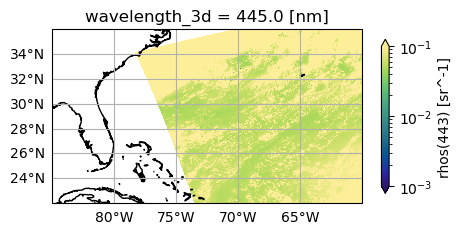

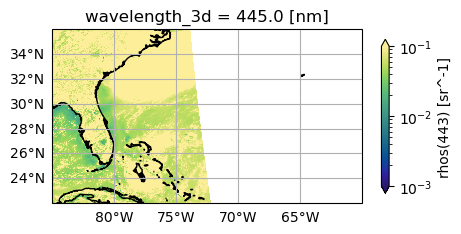

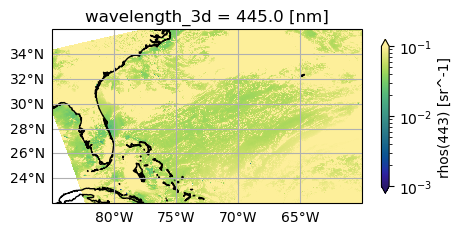

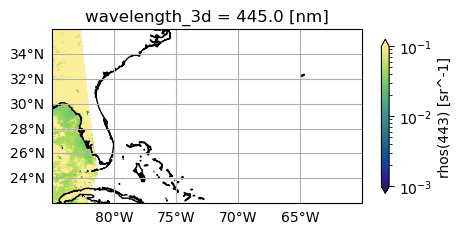

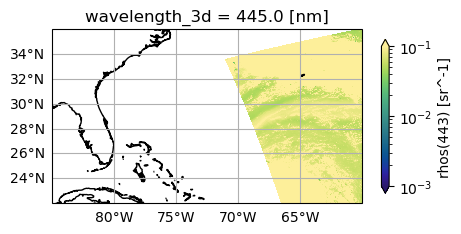

...

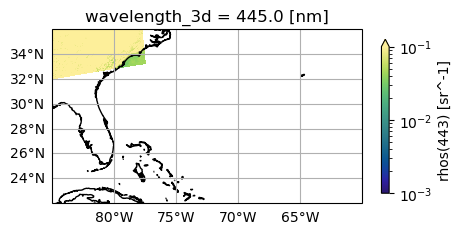

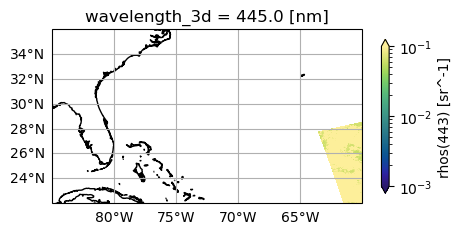

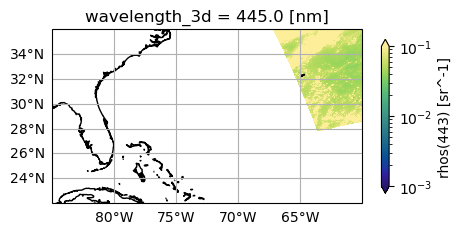

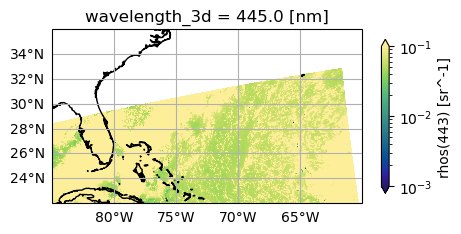

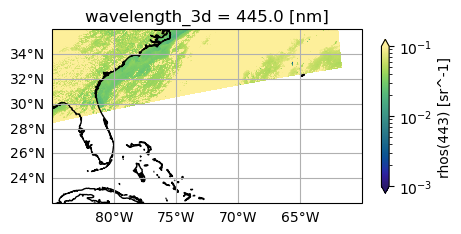

In [14]:
# Add cell to plot unprocessed granules to see what they look like
# for i, path in enumerate(pre_paths):
#     datatree = xr.open_datatree(path)
#     dataset = xr.merge(datatree.to_dict().values())
#     dataset = dataset.set_coords(("longitude", "latitude"))
#     print(dataset[var_name].coords)

#     var_data = dataset[var_name]
#     var_data = var_data.transpose('wavelength_3d', 'number_of_lines', 'pixels_per_line')

#     fig, ax = plt.subplots(figsize=(5, 4), subplot_kw={'projection': ccrs.PlateCarree()})
#     ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
#     plot = var_data.sel(wavelength_3d=443, method='nearest').plot(
#         x="longitude", y="latitude",
#         cbar_kwargs={'label': 'rhos(443) [sr^-1]', 'shrink': 0.5},
#         cmap=cmocean.cm.haline,
#         norm=LogNorm(vmin=.001, vmax=0.1),
#         ax=ax,
#         robust=True
#     )
#     ax.set_xlim(bbox[0]-3, bbox[2]+3)
#     ax.set_ylim(bbox[1]-3, bbox[3]+3)
#     ax.coastlines()
#     ax.set_title(f'Granule {i+1} - Time: {str(dataset.attrs["time_coverage_start"])[:19]} - 443 nm')
#     plt.show()

for i, path in enumerate(pre_paths):
    datatree = xr.open_datatree(path,decode_timedelta=True)
    dataset = xr.merge(datatree.to_dict().values())
    dataset = dataset.isel(pixels_per_line=slice(13,None))
    dataset = dataset.set_coords(("longitude", "latitude"))

    var_data = dataset[var_name]
    var_data = var_data.transpose('wavelength_3d', 'number_of_lines', 'pixels_per_line')
    quick_plot_sref_1band(var_data)

In [15]:
# extract the geospatial characteristics from the first file in paths using 1-line function
# This cell is steps is parts 1, 2a, and 2b from previous workflow. functions clean things up nicely
crs, shape, transform, wl = load_first_SREF(pre_paths[0], var_name)# once set, dont need to rerun for other vars in same suite

/var/folders/sv/8_g9kqw50y7d70sfnr2kqzzw0000gp/T/ipykernel_1845/4071404464.py:172: FutureWarning: In a future version, xarray will not decode the variable 'day' into a timedelta64 dtype based on the presence of a timedelta-like 'units' attribute by default. Instead it will rely on the presence of a timedelta64 'dtype' attribute, which is now xarray's default way of encoding timedelta64 values.
To continue decoding into a timedelta64 dtype, either set `decode_timedelta=True` when opening this dataset, or add the attribute `dtype='timedelta64[ns]'` to this variable on disk.
To opt-in to future behavior, set `decode_timedelta=False`.
  datatree = xr.open_datatree(path)
/var/folders/sv/8_g9kqw50y7d70sfnr2kqzzw0000gp/T/ipykernel_1845/4071404464.py:172: FutureWarning: In a future version, xarray will not decode the variable 'msec' into a timedelta64 dtype based on the presence of a timedelta-like 'units' attribute by default. Instead it will rely on the presence of a timedelta64 'dtype' attr

Coordinates:
  * wavelength_3d  (wavelength_3d) float64 976B 346.0 351.0 ... 2.258e+03
    longitude      (number_of_lines, pixels_per_line) float32 9MB ...
    latitude       (number_of_lines, pixels_per_line) float32 9MB ...


In [ ]:
pre_data = coregister_granules_SREF(pre_paths, crs, shape, transform, var_name)

/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/node.py:187: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 51793 instead
  warnings.warn(
/var/folders/sv/8_g9kqw50y7d70sfnr2kqzzw0000gp/T/ipykernel_1845/4071404464.py:70: FutureWarning: In a future version, xarray will not decode the variable 'day' into a timedelta64 dtype based on the presence of a timedelta-like 'units' attribute by default. Instead it will rely on the presence of a timedelta64 'dtype' attribute, which is now xarray's default way of encoding timedelta64 values.
To continue decoding into a timedelta64 dtype, either set `decode_timedelta=True` when opening this dataset, or add the attribute `dtype='timedelta64[ns]'` to this variable on disk.
To opt-in to future behavior, set `decode_timedelta=False`.
/var/folders/sv/8_g9kqw50y7d70sfnr2kqzzw0000gp/T/ipykernel_1845/4071404464.py:70: FutureWarning: In a future version, x

KilledWorker: Attempted to run task 'grid_match_SREF-ed67c7ddfa95a98b2b965a2093479b1a' on 4 different workers, but all those workers died while running it. The last worker that attempt to run the task was tcp://127.0.0.1:52066. Inspecting worker logs is often a good next step to diagnose what went wrong. For more information see https://distributed.dask.org/en/stable/killed.html.

2025-11-03 11:09:12,565 - distributed.nanny.memory - WARNING - Worker tcp://127.0.0.1:52103 (pid=12018) exceeded 95% memory budget. Restarting...
2025-11-03 11:09:12,731 - distributed.nanny - WARNING - Restarting worker
2025-11-03 11:09:15,218 - distributed.nanny - WARNING - Worker process still alive after 4.0 seconds, killing
2025-11-03 11:09:15,248 - distributed.nanny - WARNING - Worker process still alive after 4.0 seconds, killing
2025-11-03 11:09:15,547 - distributed.nanny.memory - WARNING - Worker tcp://127.0.0.1:52108 (pid=12022) exceeded 95% memory budget. Restarting...
2025-11-03 11:09:15,736 - distributed.scheduler - ERROR - Task grid_match_SREF-ec438d72ca75b5814f7150466b414520 marked as failed because 4 workers died while trying to run it
2025-11-03 11:09:15,737 - distributed.nanny - WARNING - Restarting worker
2025-11-03 11:09:16,956 - distributed.nanny.memory - WARNING - Worker tcp://127.0.0.1:52118 (pid=12028) exceeded 95% memory budget. Restarting...
2025-11-03 11:09:17

In [ ]:
# Now, plot the regridded data to see how it looks at 443 nm
pre_data_2 = pre_data.assign_coords(wavelength_3d=wl)
# for i, data_slice in enumerate(pre_data_2):
#     fig, ax = plt.subplots(figsize=(5, 4), subplot_kw={'projection': ccrs.PlateCarree()})
#     ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
#     plot = data_slice.sel(wavelength_3d=443, method='nearest').plot(
#         x="longitude", y="latitude",
#         cbar_kwargs={'label': 'rhos(443) [sr^-1]', 'shrink': 0.5},
#         cmap=cmocean.cm.haline,
#         norm=LogNorm(vmin=.001, vmax=0.1),
#         ax=ax,
#         robust=True
#     )
#     ax.set_xlim(bbox[0]-3, bbox[2]+3)
#     ax.set_ylim(bbox[1]-3, bbox[3]+3)
#     ax.coastlines()
#     ax.set_title(f'Granule {i+1} - Time: {str(data_slice.time.values)[:19]} - 443 nm')
#     plt.show()

for i, data_slice in enumerate(pre_data_2):
    quick_plot_sref_1band(data_slice)

In [ ]:
pre_data_2 = pre_data.assign_coords(wavelength_3d=wl)
rhos_rgb = pre_data_2.sel(wavelength_3d=[610, 555, 465], method="nearest")

In [ ]:
img_array = rhos_rgb.transpose("time", "latitude", "longitude", "wavelength_3d")

for i, data_slice in enumerate(img_array):
    rgb = enhance(data_slice)

    # Mask pixels where all channels are zero (fully black regions)
    # zero_mask = (rgb == 0).all(dim="wavelength_3d")
    # rgb = rgb.where(~zero_mask)

    fig = plt.figure(figsize=(10, 10))
    axes = plt.subplot(projection=ccrs.PlateCarree())
    artist = axes.pcolormesh(
        rgb["longitude"],
        rgb["latitude"],
        rgb,
        shading="nearest",
        rasterized=True,
        )
    axes.set_aspect("equal")
    axes.set_xlim(bbox[0]-3,bbox[2]+3)
    axes.set_ylim(bbox[1]-3,bbox[3]+3)
    axes.coastlines()
    plt.show()



In [ ]:
img_array = rhos_rgb.transpose("time", "latitude", "longitude", "wavelength_3d")
zero_mask = (img_array == 0).all(dim="wavelength_3d")
img_array = img_array.where(~zero_mask)
#img_array = img_array.groupby(img_array['time'].dt.date).mean(dim='time') # average all granules from same day together
# Group by the unique dates and compute the mean for each group
img_array_bydate = img_array.groupby(img_array['time'].dt.date).mean(dim='time')

# Precompute the granule count for each unique date
granule_counts = granule_counts = [len(indices) for indices in img_array.groupby(img_array['time'].dt.date).groups.values()]

# Rename the 'date' coordinate to 'time' to maintain consistency
img_array_bydate = img_array_bydate.rename({'date': 'time'})

# Ensure the 'time' coordinate is properly set
img_array_bydate = img_array_bydate.assign_coords(time=img_array_bydate['time'])

for i, data_slice in enumerate(img_array_bydate):
    rgb = enhance(data_slice)

    # Mask pixels where all channels are zero (fully black regions)
    # zero_mask = (rgb == 0).all(dim="wavelength_3d")
    # rgb = rgb.where(~zero_mask)

    fig = plt.figure(figsize=(10, 10))
    axes = plt.subplot(projection=ccrs.PlateCarree())
    artist = axes.pcolormesh(
        rgb["longitude"],
        rgb["latitude"],
        rgb,
        shading="nearest",
        rasterized=True,
        )
    axes.set_aspect("equal")
    axes.set_xlim(bbox[0],bbox[2])
    axes.set_ylim(bbox[1],bbox[3])
    axes.coastlines()
    plt.text(
        1, 0.025,  # Coordinates in axes fraction (relative to the plot)
        f'{str(data_slice["time"].values)[:10]}',
        transform=axes.transAxes,  # Use axes coordinates
        fontsize=12,
        ha="right",  # Align text to the right
        va="center",  # Align text to the bottom
        bbox=dict(facecolor="white", alpha=0.8, edgecolor="none")  # Add a background box
    )
    plt.text(
        1, 1-0.03,  # Coordinates in axes fraction (relative to the plot)
        f'Granules: {granule_counts[i]}',
        transform=axes.transAxes,  # Use axes coordinates
        fontsize=8,
        ha="right",  # Align text to the right
        va="center",  # Align text to the bottom
        bbox=dict(facecolor="white", alpha=0.8, edgecolor="none")  # Add a background box
    )
    plt.show()
# rgb = enhance(img_array)
# # Mask pixels where all channels are zero (fully black regions)
# zero_mask = (rgb == 0).all(dim="wavelength_3d")
# rgb = rgb.where(~zero_mask)

# fig = plt.figure(figsize=(10, 10))
# axes = plt.subplot(projection=ccrs.PlateCarree())
# artist = axes.pcolormesh(
#     rgb["longitude"],
#     rgb["latitude"],
#     rgb,
#     shading="nearest",
#     rasterized=True,
#     )
# axes.set_aspect("equal")
# axes.set_xlim(bbox[0]-3,bbox[2]+3)
# axes.set_ylim(bbox[1]-3,bbox[3]+3)
# axes.coastlines()
# plt.show()

In [ ]:
# Create true color image animation
# List to store frames
frames = []

for i, data_slice in enumerate(img_array_bydate):
    rgb = enhance(data_slice)

    # Mask pixels where all channels are zero (fully black regions)
    # zero_mask = (rgb == 0).all(dim="wavelength_3d")
    # rgb = rgb.where(~zero_mask)

    fig = plt.figure(figsize=(10, 10))
    axes = plt.subplot(projection=ccrs.PlateCarree())
    artist = axes.pcolormesh(
        rgb["longitude"],
        rgb["latitude"],
        rgb,
        shading="nearest",
        rasterized=True,
    )
    axes.set_aspect("equal")
    axes.set_xlim(bbox[0], bbox[2])
    axes.set_ylim(bbox[1], bbox[3])
    axes.coastlines()
    plt.text(
        1, 0.025,  # Coordinates in axes fraction (relative to the plot)
        f'{str(data_slice["time"].values)[:10]}',
        transform=axes.transAxes,  # Use axes coordinates
        fontsize=12,
        ha="right",  # Align text to the right
        va="center",  # Align text to the bottom
        bbox=dict(facecolor="white", alpha=0.8, edgecolor="none")  # Add a background box
    )
    plt.text(
        1, 1 - 0.03,  # Coordinates in axes fraction (relative to the plot)
        f'Granules: {granule_counts[i]}',
        transform=axes.transAxes,  # Use axes coordinates
        fontsize=8,
        ha="right",  # Align text to the right
        va="center",  # Align text to the bottom
        bbox=dict(facecolor="white", alpha=0.8, edgecolor="none")  # Add a background box
    )

    # Save the current frame to a BytesIO object
    buf = BytesIO()
    plt.savefig(buf, format='png', bbox_inches='tight')
    buf.seek(0)
    frames.append(imageio.imread(buf))
    buf.close()
    plt.close(fig)

# Save all frames as a .gif
#gifpath = '/Users/mkehrli/Desktop/PRR_Plots/ErinTC.gif'
#imageio.mimsave(gifpath, frames, fps=2)  # Adjust fps for speed
# Display the GIF in the notebook
#Image(filename=gifpath)

## Make True Color GIF attempt 2

In [ ]:
# # User definitions:
tspan = ("2025-08-15", "2025-09-05")    # define your pre-event and post-event timespans

min_lon = -82       # Set lat/lon extent for area of interest
min_lat = 25
max_lon = -63
max_lat = 33

# OCI suite and variable of interest within a particular suite
suite_name="PACE_OCI_L2_SFREFL_NRT" # shortname of the suite, e.g. For PACE: PACE_OCI_L2_SFREFL_NRT, PACE_OCI_L2_BGC_NRT, PACE_OCI_L2_AOP_NRT, etc. (plan to add more to this comment)
var_name = "rhos" # variable of interest

in_the_cloud = False # set to true if running in cloud (e.g. Cryocloud), false if running locally. For speed, granules will be downloaded to a local_data directory when set to false

In [ ]:
# Perform the earthdata search:
bbox = (min_lon, min_lat, max_lon, max_lat)

results = earthaccess.search_data(
    short_name=suite_name,
    temporal=tspan,
    bounding_box=bbox,
    version="3.1"
)
print(" Number of pre-event granules: "+str(len(results)))

BGC_results = earthaccess.search_data(
    short_name="PACE_OCI_L2_BGC_NRT",
    temporal=tspan,
    bounding_box=bbox,
    version="3.1"
)

# in running this script in the cloud, earthaccess.open is fast, but when running locally it takes a long time (10+ min), and locally downloading the data is faster.
# so, get the data with different approaches, depening on whether you are in the cloud or not, defined above
if in_the_cloud == True:
    pre_paths = earthaccess.open(results)
    pre_paths_BGC = earthaccess.open(BGC_results)
else:
    pre_paths = earthaccess.download(results, local_path="local_data/")
    pre_paths_BGC = earthaccess.download(BGC_results, local_path="local_data/")

print('Files Downloaded')

In [ ]:
# Regex pattern to extract the date in the format YYYYMMDD
date_pattern = re.compile(r"\.(\d{8})T")

# Dictionary to store paths grouped by date
paths_by_date = defaultdict(list)
paths_by_date_BGC = defaultdict(list)

# Iterate over pre_paths and group by date
for path in pre_paths:
    # Extract the date from the filename
    filename = os.path.basename(path)
    match = date_pattern.search(filename)
    if match:
        date = match.group(1)  # Extracted date (e.g., "20250817")
        paths_by_date[date].append(path)

# Iterate over pre_paths_BGC and group by date
for path in pre_paths_BGC:
    # Extract the date from the filename
    filename = os.path.basename(path)
    match = date_pattern.search(filename)
    if match:
        date = match.group(1)  # Extracted date (e.g., "20250817")
        paths_by_date_BGC[date].append(path)
        
# Print grouped paths
for date, paths in paths_by_date.items():
    print(f"Date: {date}, Number of files: {len(paths)}")
    print(paths)



In [ ]:

# extract the geospatial characteristics from the first file in paths using 1-line function
# This cell is steps is parts 1, 2a, and 2b from previous workflow. functions clean things up nicely
crs, shape, transform, wl = load_first_SREF(pre_paths[0], var_name)# once set, dont need to rerun for other vars in same suite
crs_BGC, shape_BGC, transform_BGC = load_first(pre_paths_BGC[0], "chlor_a")# once set, dont need to rerun for other vars in same suite

In [ ]:
#for date, paths in paths_by_date.items():
for i, (date, paths) in enumerate(paths_by_date.items()):
    print(f"Date: {date}")
    print(f"Paths: {paths}")
    # Perform operations on the first iteration
    data = coregister_granules_SREF(paths, crs, shape, transform, var_name)

    data_2 = data.assign_coords(wavelength_3d=wl)
    rhos_rgb = data_2.sel(wavelength_3d=[610, 555, 465], method="nearest")

    img_array = rhos_rgb.transpose("time", "latitude", "longitude", "wavelength_3d")
    zero_mask = (img_array == 0).all(dim="wavelength_3d")
    img_array = img_array.where(~zero_mask)
    img_array = img_array.mean("time")
    #img_array = img_array.groupby(img_array['time'].dt.date).mean(dim='time') # average all granules from same day together
    # Group by the unique dates and compute the mean for each group
    # img_array_bydate = img_array.groupby(img_array['time'].dt.date).mean(dim='time')

    # # Precompute the granule count for each unique date
    # granule_counts = granule_counts = [len(indices) for indices in img_array.groupby(img_array['time'].dt.date).groups.values()]

    # # Rename the 'date' coordinate to 'time' to maintain consistency
    # img_array_bydate = img_array_bydate.rename({'date': 'time'})

    # # Ensure the 'time' coordinate is properly set
    # img_array_bydate = img_array_bydate.assign_coords(time=img_array_bydate['time'])

    rgb = enhance(img_array)

    fig = plt.figure(figsize=(10, 10))
    axes = plt.subplot(projection=ccrs.PlateCarree())
    artist = axes.pcolormesh(
        rgb["longitude"],
        rgb["latitude"],
        rgb,
        shading="nearest",
        rasterized=True,
        )
    axes.set_aspect("equal")
    axes.set_xlim(bbox[0],bbox[2])
    axes.set_ylim(bbox[1],bbox[3])
    axes.coastlines()
    axes.gridlines(draw_labels={"left": "y", "bottom": "x"})
    date_str = [str(date) for date in data["time"].dt.date.values]
    plt.text(
        1, 0.025,  # Coordinates in axes fraction (relative to the plot)
        f'{date_str[0]}',
        transform=axes.transAxes,  # Use axes coordinates
        fontsize=12,
        ha="right",  # Align text to the right
        va="center",  # Align text to the bottom
        bbox=dict(facecolor="white", alpha=0.8, edgecolor="none")  # Add a background box
    )
    plt.text(
        1, 1-0.03,  # Coordinates in axes fraction (relative to the plot)
        f'Granules: {data_2.shape[0]}',
        transform=axes.transAxes,  # Use axes coordinates
        fontsize=8,
        ha="right",  # Align text to the right
        va="center",  # Align text to the bottom
        bbox=dict(facecolor="white", alpha=0.8, edgecolor="none")  # Add a background box
    )
    plt.savefig(f'/Users/mkehrli/Desktop/PRR_Plots/tcgif/ErinTC{str(i).zfill(3)}v2.png', bbox_inches='tight')
    plt.close()

In [ ]:
# Define the folder containing the images and the output GIF path
image_folder = "/Users/mkehrli/Desktop/PRR_Plots/tcgif/"
output_gif = "/Users/mkehrli/Desktop/PRR_Plots/ErinTC4.gif"

# Get a sorted list of image file paths
image_files = sorted(glob.glob(os.path.join(image_folder, "*.png")))

# Read images and create the GIF
frames = []
for image in image_files:
    frames.append(imageio.imread(image))
imageio.mimsave(output_gif, frames, fps=1, loop=0)  # Adjust fps for speed

# Display the GIF in the notebook
IM(filename=output_gif)

In [ ]:
sorted(glob.glob(os.path.join(image_folder, "*.png")))

In [ ]:
#True Color with BGC overlay

for i, (date, paths) in enumerate(paths_by_date.items()):
    print(f"Date: {date}")
    print(f"Paths: {paths}")
    # Perform operations on the first iteration
    data = coregister_granules_SREF(paths, crs, shape, transform, var_name)
    data_BGC = coregister_granules(paths_by_date_BGC[date], crs_BGC, shape_BGC, transform_BGC, "chlor_a")
    data_BGC = data_BGC.drop_vars("spatial_ref", errors="ignore")

    data_2 = data.assign_coords(wavelength_3d=wl)
    rhos_rgb = data_2.sel(wavelength_3d=[610, 555, 465], method="nearest")

    img_array = rhos_rgb.transpose("time", "latitude", "longitude", "wavelength_3d")
    zero_mask = (img_array == 0).all(dim="wavelength_3d")
    img_array = img_array.where(~zero_mask)
    img_array = img_array.mean("time")
    #img_array = img_array.groupby(img_array['time'].dt.date).mean(dim='time') # average all granules from same day together
    # Group by the unique dates and compute the mean for each group
    # img_array_bydate = img_array.groupby(img_array['time'].dt.date).mean(dim='time')

    # # Precompute the granule count for each unique date
    # granule_counts = granule_counts = [len(indices) for indices in img_array.groupby(img_array['time'].dt.date).groups.values()]

    # # Rename the 'date' coordinate to 'time' to maintain consistency
    # img_array_bydate = img_array_bydate.rename({'date': 'time'})

    # # Ensure the 'time' coordinate is properly set
    # img_array_bydate = img_array_bydate.assign_coords(time=img_array_bydate['time'])

    rgb = enhance(img_array)

    fig = plt.figure(figsize=(10, 10))
    axes = plt.subplot(projection=ccrs.PlateCarree())
    artist = axes.pcolormesh(
        rgb["longitude"],
        rgb["latitude"],
        rgb,
        shading="nearest",
        rasterized=True,
    )
    plot = data_BGC.mean("time").plot(
        x="longitude", y="latitude",
        cmap=cmocean.cm.thermal,
        norm=LogNorm(vmin=0.01, vmax=1),
        ax=axes,
        alpha=1,  # Add transparency so the RGB background shows through, 1 is opaque
        add_colorbar=False,  # Add colorbar for diatoms
        transform=ccrs.PlateCarree()
    )
    cbar = axes.figure.colorbar(plot, orientation='vertical', pad=0.05, shrink=0.3)
    cbar.set_label("chlor_a [mg m^-3]")
    axes.set_aspect("equal")
    axes.set_xlim(bbox[0],bbox[2])
    axes.set_ylim(bbox[1],bbox[3])
    axes.coastlines()
    axes.gridlines(draw_labels={"left": "y", "bottom": "x"})
    date_str = [str(date) for date in data["time"].dt.date.values]
    plt.text(
        1, 0.025,  # Coordinates in axes fraction (relative to the plot)
        f'{date_str[0]}',
        transform=axes.transAxes,  # Use axes coordinates
        fontsize=12,
        ha="right",  # Align text to the right
        va="center",  # Align text to the bottom
        bbox=dict(facecolor="white", alpha=0.8, edgecolor="none")  # Add a background box
    )
    plt.text(
        1, 1-0.03,  # Coordinates in axes fraction (relative to the plot)
        f'Granules: {data_2.shape[0]}',
        transform=axes.transAxes,  # Use axes coordinates
        fontsize=8,
        ha="right",  # Align text to the right
        va="center",  # Align text to the bottom
        bbox=dict(facecolor="white", alpha=0.8, edgecolor="none")  # Add a background box
    )
    axes.gridlines(draw_labels={"left": "y", "bottom": "x"})
    plt.savefig(f'/Users/mkehrli/Desktop/PRR_Plots/tcgif/ErinTC_BCG{str(i).zfill(3)}v2.png', bbox_inches='tight')
    plt.close()

In [ ]:
# Define the folder containing the images and the output GIF path
image_folder = "/Users/mkehrli/Desktop/PRR_Plots/tcgif/"
output_gif = "/Users/mkehrli/Desktop/PRR_Plots/ErinTC4_BGC.gif"

# Get a sorted list of image file paths
image_files = sorted(glob.glob(os.path.join(image_folder, "*BCG*.png")))

# Read images and create the GIF
frames = []
for image in image_files:
    frames.append(imageio.imread(image))
imageio.mimsave(output_gif, frames, fps=1, loop=0)  # Adjust fps for speed

# Display the GIF in the notebook
IM(filename=output_gif)

In [17]:
# Determine pixel values around target area of interest (Start over data search)
# # User definitions:
tspan = ("2025-08-15", "2025-09-05")    # define your pre-event and post-event timespans

min_lon = -82       # Set lat/lon extent for area of interest
min_lat = 25
max_lon = -63
max_lat = 33

# OCI suite and variable of interest within a particular suite
suite_name="PACE_OCI_L2_BGC_NRT" # shortname of the suite, e.g. For PACE: PACE_OCI_L2_SFREFL_NRT, PACE_OCI_L2_BGC_NRT, PACE_OCI_L2_AOP_NRT, etc. (plan to add more to this comment)
var_name = "chlor_a" # variable of interest

in_the_cloud = False #

# Perform the earthdata search:
bbox = (min_lon, min_lat, max_lon, max_lat)

BGC_results = earthaccess.search_data(
    short_name=suite_name,
    temporal=tspan,
    bounding_box=bbox,
    version="3.1"
)

# in running this script in the cloud, earthaccess.open is fast, but when running locally it takes a long time (10+ min), and locally downloading the data is faster.
# so, get the data with different approaches, depening on whether you are in the cloud or not, defined above
if in_the_cloud == True:
    paths_BGC = earthaccess.open(BGC_results)
else:
    paths_BGC = earthaccess.download(BGC_results, local_path="local_data/")
print('Files Downloaded')


QUEUEING TASKS | :   0%|          | 0/63 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/63 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/63 [00:00<?, ?it/s]

Files Downloaded


In [18]:

crs_BGC, shape_BGC, transform_BGC = load_first(paths_BGC[0], var_name)
data_BGC = coregister_granules(paths_BGC, crs_BGC, shape_BGC, transform_BGC, "chlor_a")


/var/folders/sv/8_g9kqw50y7d70sfnr2kqzzw0000gp/T/ipykernel_1845/4071404464.py:136: FutureWarning: In a future version, xarray will not decode the variable 'day' into a timedelta64 dtype based on the presence of a timedelta-like 'units' attribute by default. Instead it will rely on the presence of a timedelta64 'dtype' attribute, which is now xarray's default way of encoding timedelta64 values.
To continue decoding into a timedelta64 dtype, either set `decode_timedelta=True` when opening this dataset, or add the attribute `dtype='timedelta64[ns]'` to this variable on disk.
To opt-in to future behavior, set `decode_timedelta=False`.
  datatree = xr.open_datatree(path)
/var/folders/sv/8_g9kqw50y7d70sfnr2kqzzw0000gp/T/ipykernel_1845/4071404464.py:136: FutureWarning: In a future version, xarray will not decode the variable 'msec' into a timedelta64 dtype based on the presence of a timedelta-like 'units' attribute by default. Instead it will rely on the presence of a timedelta64 'dtype' attr

loaded pre event files


In [19]:
# Group the data by date and compute the mean for each group
data_BGC_by_date = data_BGC.groupby(data_BGC['time'].dt.date).mean(dim='time')

# Rename the 'date' coordinate to 'time' to maintain consistency
data_BGC_by_date = data_BGC_by_date.rename({'date': 'time'})

# Ensure the 'time' coordinate is properly set
data_BGC_by_date = data_BGC_by_date.assign_coords(time=data_BGC_by_date['time'])

# Print the result to verify
print(str(data_BGC_by_date.time.values))


[datetime.date(2025, 8, 15) datetime.date(2025, 8, 16)
 datetime.date(2025, 8, 17) datetime.date(2025, 8, 18)
 datetime.date(2025, 8, 19) datetime.date(2025, 8, 20)
 datetime.date(2025, 8, 21) datetime.date(2025, 8, 22)
 datetime.date(2025, 8, 24) datetime.date(2025, 8, 25)
 datetime.date(2025, 8, 26) datetime.date(2025, 8, 27)
 datetime.date(2025, 8, 28) datetime.date(2025, 8, 29)
 datetime.date(2025, 8, 30) datetime.date(2025, 8, 31)
 datetime.date(2025, 9, 1) datetime.date(2025, 9, 2)
 datetime.date(2025, 9, 3) datetime.date(2025, 9, 4)
 datetime.date(2025, 9, 5)]


In [20]:
# Define the target lat/lon coordinates
tar_coords_1 = [26.5, -68.75]
tar_coords_2 = [26.5, -71.25]
tar_coords_3 = [27.5, -68.75]
tar_coords_4 = [27.5, -71.25]
tar_coords_5 = [27.5, -73.75]


# Find the nearest point to the target lat/lon coordinates
tar1datanear = data_BGC_by_date.sel(latitude=tar_coords_1[0], longitude=tar_coords_1[1], method='nearest')
tar2datanear = data_BGC_by_date.sel(latitude=tar_coords_2[0], longitude=tar_coords_2[1], method='nearest')
tar3datanear = data_BGC_by_date.sel(latitude=tar_coords_3[0], longitude=tar_coords_3[1], method='nearest')
tar4datanear = data_BGC_by_date.sel(latitude=tar_coords_4[0], longitude=tar_coords_4[1], method='nearest') 
tar5datanear = data_BGC_by_date.sel(latitude=tar_coords_5[0], longitude=tar_coords_5[1], method='nearest')


# Determine the index of lat/lon to the target coordinate
tarcoords1_idx = [data_BGC_by_date.latitude.values.tolist().index(tar1datanear.latitude.values), \
                  data_BGC_by_date.longitude.values.tolist().index(tar1datanear.longitude.values)]
tarcoords2_idx = [data_BGC_by_date.latitude.values.tolist().index(tar2datanear.latitude.values), \
                  data_BGC_by_date.longitude.values.tolist().index(tar2datanear.longitude.values)]
tarcoords3_idx = [data_BGC_by_date.latitude.values.tolist().index(tar3datanear.latitude.values), \
                  data_BGC_by_date.longitude.values.tolist().index(tar3datanear.longitude.values)]
tarcoords4_idx = [data_BGC_by_date.latitude.values.tolist().index(tar4datanear.latitude.values), \
                  data_BGC_by_date.longitude.values.tolist().index(tar4datanear.longitude.values)]
tarcoords5_idx = [data_BGC_by_date.latitude.values.tolist().index(tar5datanear.latitude.values), \
                  data_BGC_by_date.longitude.values.tolist().index(tar5datanear.longitude.values)]

# Select adjacent data
tar1_data = data_BGC_by_date.isel(latitude=slice(tarcoords1_idx[0]-6, tarcoords1_idx[0]+9), \
                                  longitude=slice(tarcoords1_idx[1]-6, tarcoords1_idx[1]+9))
tar2_data = data_BGC_by_date.isel(latitude=slice(tarcoords2_idx[0]-6, tarcoords2_idx[0]+9), \
                                  longitude=slice(tarcoords2_idx[1]-6, tarcoords2_idx[1]+9))
tar3_data = data_BGC_by_date.isel(latitude=slice(tarcoords3_idx[0]-6, tarcoords3_idx[0]+9), \
                                  longitude=slice(tarcoords3_idx[1]-6, tarcoords3_idx[1]+9))
tar4_data = data_BGC_by_date.isel(latitude=slice(tarcoords4_idx[0]-6, tarcoords4_idx[0]+9), \
                                  longitude=slice(tarcoords4_idx[1]-6, tarcoords4_idx[1]+9))
tar5_data = data_BGC_by_date.isel(latitude=slice(tarcoords5_idx[0]-6, tarcoords5_idx[0]+9), \
                                  longitude=slice(tarcoords5_idx[1]-6, tarcoords5_idx[1]+9))

tar1_data_mean = tar1_data.mean(dim=['latitude','longitude'])
tar2_data_mean = tar2_data.mean(dim=['latitude','longitude'])
tar3_data_mean = tar3_data.mean(dim=['latitude','longitude']) 
tar4_data_mean = tar4_data.mean(dim=['latitude','longitude'])
tar5_data_mean = tar5_data.mean(dim=['latitude','longitude'])




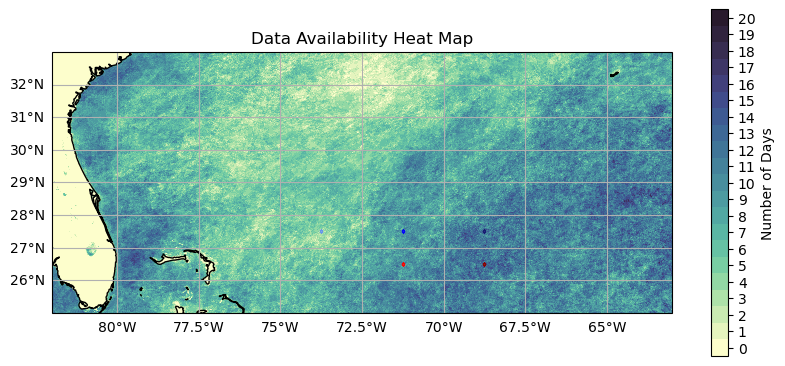

In [21]:
# Count the number of non-NaN values across the time dimension
data_count = data_BGC_by_date.count(dim='time')

# Get the total number of days in the 'time' dimension
total_days = len(data_BGC_by_date['time'])

# Create a discrete colormap with `total_days` colors
discrete_cmap = ListedColormap(cmocean.cm.deep(np.linspace(0, 1, total_days)))

# Define boundaries for the colormap
boundaries = np.arange(0, total_days + 1)  # One boundary for each day

# Plot the heat map
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
im = data_count.plot(
    x='longitude',
    y='latitude',
    cmap=discrete_cmap,  # Use the discrete colormap
    cbar_kwargs={
        'label': 'Number of Days',
        'spacing': 'proportional',
        'pad': 0.05,
        'shrink': 0.75
    },
    vmin=0,
    vmax=total_days,  # Set color bar range
    ax=ax
)

# Adjust the colorbar ticks to center them in each bin
cbar = im.colorbar
cbar.set_ticks(boundaries[:-1] + 0.5)  # Center ticks in each bin
cbar.set_ticklabels(boundaries[:-1])  # Set tick labels

# Set the plot extent (xmin, xmax, ymin, ymax)
ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)

ax.plot(tar_coords_1[1], tar_coords_1[0], 's', markersize=2, label='Target Point', markerfacecolor='none', markeredgecolor=mcolors.CSS4_COLORS['darkred'])
ax.plot(tar_coords_2[1], tar_coords_2[0], 's', markersize=2, label='Target Point', markerfacecolor='none', markeredgecolor=mcolors.CSS4_COLORS['red'])
ax.plot(tar_coords_3[1], tar_coords_3[0], 's', markersize=2, label='Target Point', markerfacecolor='none', markeredgecolor=mcolors.CSS4_COLORS['midnightblue'])
ax.plot(tar_coords_4[1], tar_coords_4[0], 's', markersize=2, label='Target Point', markerfacecolor='none', markeredgecolor=mcolors.CSS4_COLORS['blue'])
ax.plot(tar_coords_5[1], tar_coords_5[0], 's', markersize=2, label='Target Point', markerfacecolor='none', markeredgecolor=mcolors.CSS4_COLORS['cornflowerblue'])
# pixel_size = 0.1  # Adjust this value based on your grid resolution
# box = Rectangle(
#     (tar_coords_5[1] - 2.5 * pixel_size, tar_coords_5[0] - 2.5 * pixel_size),  # Bottom-left corner
#     5 * pixel_size,  # Width
#     5 * pixel_size,  # Height
#     linewidth=2,
#     edgecolor='red',
#     facecolor='none'
# )
# ax.add_patch(box)

# # Determine the pixel size based on the dataset's resolution
# pixel_size_lat = abs(data_BGC_by_date.latitude[1] - data_BGC_by_date.latitude[0])
# pixel_size_lon = abs(data_BGC_by_date.longitude[1] - data_BGC_by_date.longitude[0])

# # Calculate the bottom-left corner of the box
# box_bottom_left_lat = data_BGC_by_date.latitude[tarcoords5_idx[0]] - 2.5 * pixel_size_lat
# box_bottom_left_lon = data_BGC_by_date.longitude[tarcoords5_idx[1]] - 2.5 * pixel_size_lon

# # Add the rectangle to the plot
# box = Rectangle(
#     (box_bottom_left_lon, box_bottom_left_lat),  # Bottom-left corner
#     5 * pixel_size_lon,  # Width
#     5 * pixel_size_lat,  # Height
#     linewidth=2,
#     edgecolor='red',
#     facecolor='none'
# )
# ax.add_patch(box)

ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
ax.coastlines()
ax.set_title('Data Availability Heat Map')
plt.show()


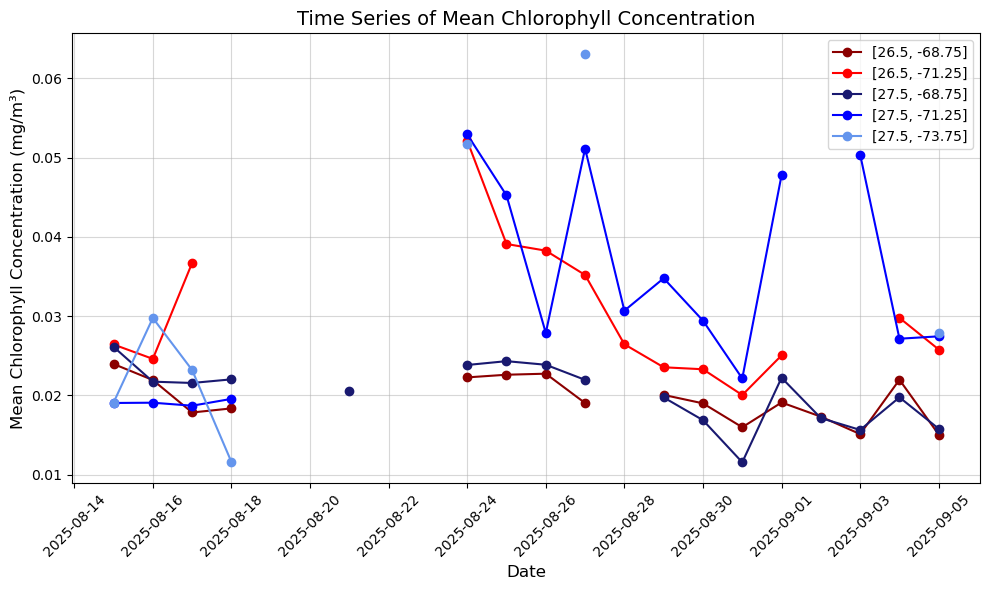

In [22]:
# Extract the time values and chlorophyll concentrations for tar1_data_mean
time_values = tar1_data_mean['time'].values

# Create the plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(time_values, tar1_data_mean.values, marker='o', linestyle='-', color=mcolors.CSS4_COLORS['darkred'], label=str(tar_coords_1))
ax.plot(time_values, tar2_data_mean.values, marker='o', linestyle='-', color=mcolors.CSS4_COLORS['red'], label=str(tar_coords_2))
ax.plot(time_values, tar3_data_mean.values, marker='o', linestyle='-', color=mcolors.CSS4_COLORS['midnightblue'], label=str(tar_coords_3))
ax.plot(time_values, tar4_data_mean.values, marker='o', linestyle='-', color=mcolors.CSS4_COLORS['blue'], label=str(tar_coords_4))
ax.plot(time_values, tar5_data_mean.values, marker='o', linestyle='-', color=mcolors.CSS4_COLORS['cornflowerblue'], label=str(tar_coords_5))

# Format the x-axis to show dates
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Mean Chlorophyll Concentration (mg/m³)', fontsize=12)
ax.set_title('Time Series of Mean Chlorophyll Concentration', fontsize=14)
ax.grid(True, linestyle='-', alpha=0.5)
ax.legend()

# Set x-axis ticks to show every fourth day
ax.xaxis.set_major_locator(mdates.DayLocator(interval=2))
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

In [ ]:
data_BGC_by_date['latitude'].values.tolist()

In [ ]:
data_BGC_by_date.latitude.isel(latitude=100) - data_BGC_by_date.latitude.isel(latitude=99)

## Work with L3 files to extract MOANNA data


In [23]:
# User definitions:

tspan = ("2025-08-09", "2025-09-05")  

min_lon = -82       # Set lat/lon extent for area of interest
min_lat = 25 
max_lon = -63
max_lat = 33

# OCI suite and variable of interest within a particular suite
#suite_name="PACE_OCI_L4M_MOANA_NRT" # shortname of the suite, e.g. For PACE: PACE_OCI_L2_BGC_NRT, PACE_OCI_L2_AOP_NRT, etc. (plan to add more to this comment)
suite_name="PACE_OCI_L4M_MOANA_NRT" # shortname of the suite, e.g. For PACE: PACE_OCI_L2_SFREFL_NRT, PACE_OCI_L2_BGC_NRT, PACE_OCI_L2_AOP_NRT, etc. (plan to add more to this comment)
granule_name = "*.DAY.*4km*" # pattern to match granules of interest, e.g. for 1 degree resolution granules: *.DAY.*0p1deg*, for 4 km granules: *.DAY.*4km*, etc. (plan to add more to this comment);  # Daily, 8-day or monthly: Day, 8D or MO | Resolution: 0p1deg or 0.4km
var_name = "chlor_a" # variable of interest

in_the_cloud = False # set to true if running in cloud (e.g. Cryocloud), false if running locally. For speed, granules will be downloaded to a local_data directory when set to false

In [24]:
# Perform the earthdata search:
bbox = (min_lon, min_lat, max_lon, max_lat)

results = earthaccess.search_data(
    short_name=suite_name,
    temporal=tspan,
    bounding_box=bbox,
    granule_name=granule_name,
    version="3.1"
)

# in running this script in the cloud, earthaccess.open is fast, but when running locally it takes a long time (10+ min), and locally downloading the data is faster.
# so, get the data with different approaches, depening on whether you are in the cloud or not, defined above
if in_the_cloud == True:
    paths = earthaccess.open(results)
else:
    paths = earthaccess.download(results, local_path="local_data/")

QUEUEING TASKS | :   0%|          | 0/27 [00:00<?, ?it/s]

PROCESSING TASKS | :   0%|          | 0/27 [00:00<?, ?it/s]

COLLECTING RESULTS | :   0%|          | 0/27 [00:00<?, ?it/s]

In [25]:
def time_from_attr_L4MOANNA(ds):
    # Extract the date (YYYYMMDD) from the 'id' attribute
    id_str = ds.attrs["id"]
    match = re.search(r"\.(\d{8})\.", id_str)
    if match:
        date_str = match.group(1)
        # Convert to YYYY-MM-DD format
        date_fmt = f"{date_str[:4]}-{date_str[4:6]}-{date_str[6:]}"
        datetime = f"{date_fmt}T00:00:00"
        ds["time"] = ((), np.datetime64(datetime))
        ds = ds.set_coords("time")
    else:
        raise ValueError("Date not found in 'id' attribute.")
    return ds

dataset = xr.open_mfdataset(paths, preprocess=time_from_attr_L4MOANNA, combine='nested', concat_dim='time')

#Add 2025-08-23 to dataset with NaNs since missing due to safehold
gap_ds = dataset.isel(time=-1).copy()
# Set all data variables to NaN arrays (float dtype)
for var in gap_ds.data_vars:
    shape = gap_ds[var].shape
    gap_ds[var] = (gap_ds[var].dims, np.full(shape, np.nan, dtype=float))

gap_ds = gap_ds.assign_coords(time=[np.datetime64('2025-08-23')])

dataset = xr.concat([dataset, gap_ds], dim='time')
dataset = dataset.sortby('time')



/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 67.85 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 67.85 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of

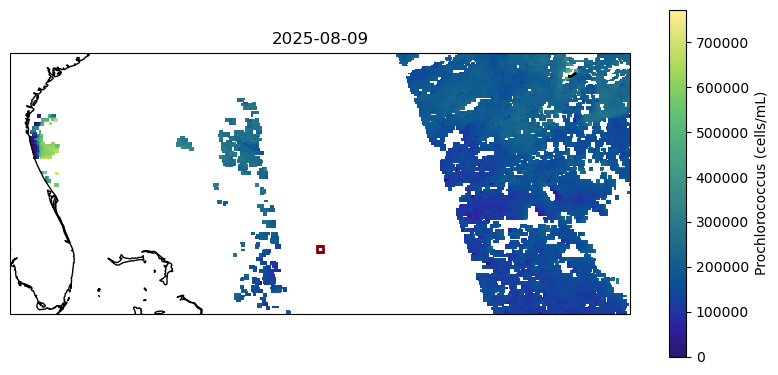

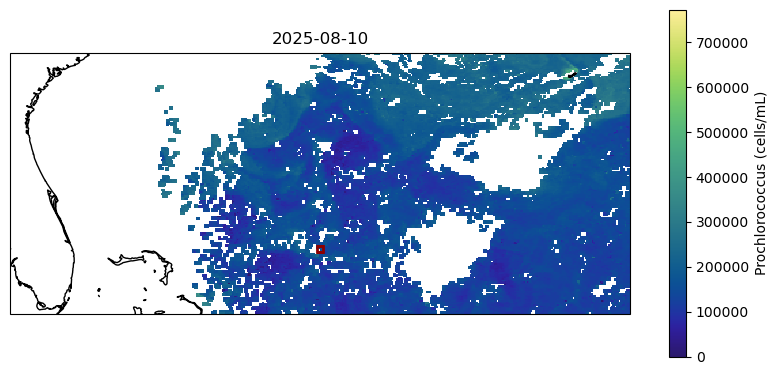

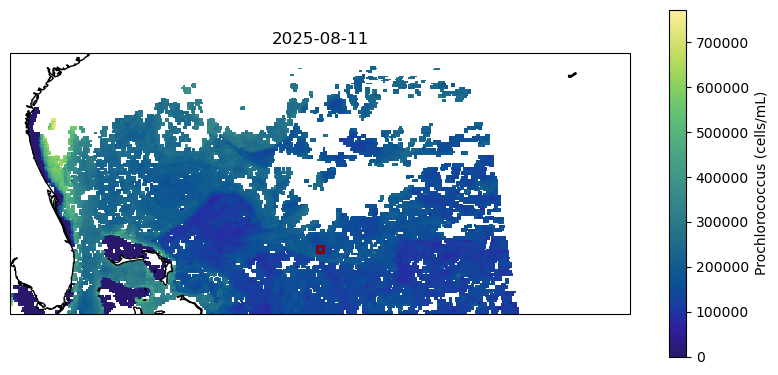

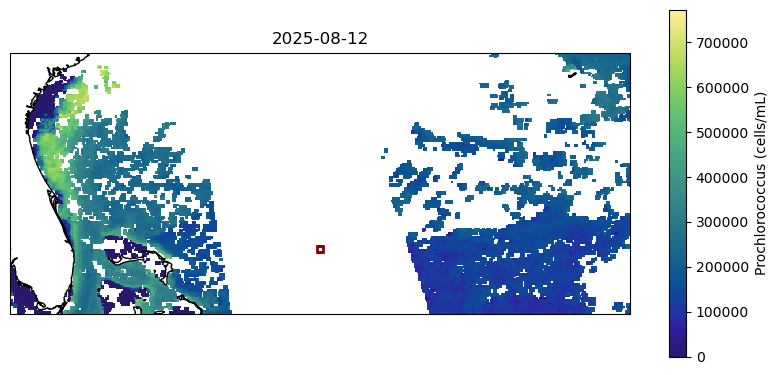

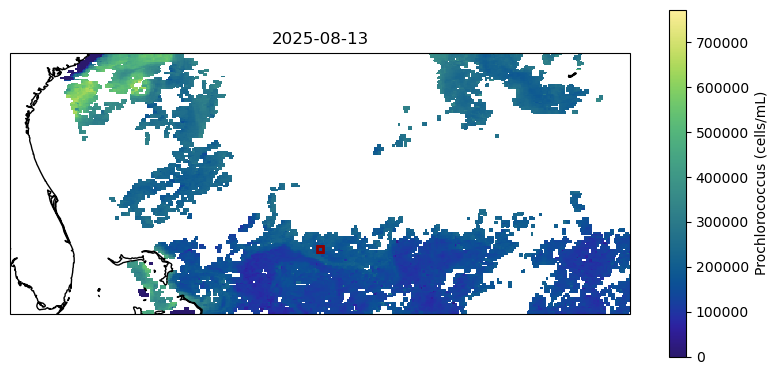

...

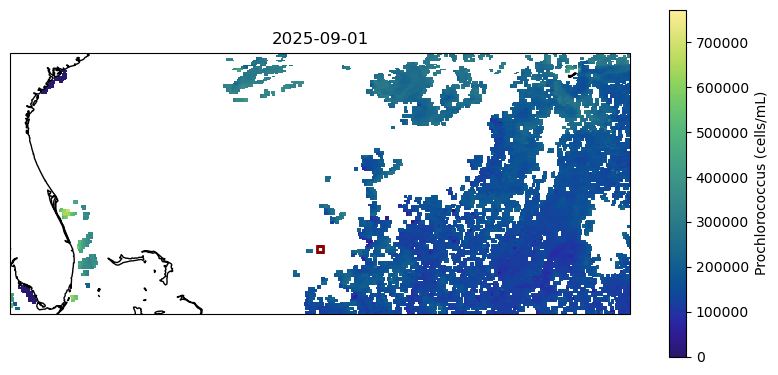

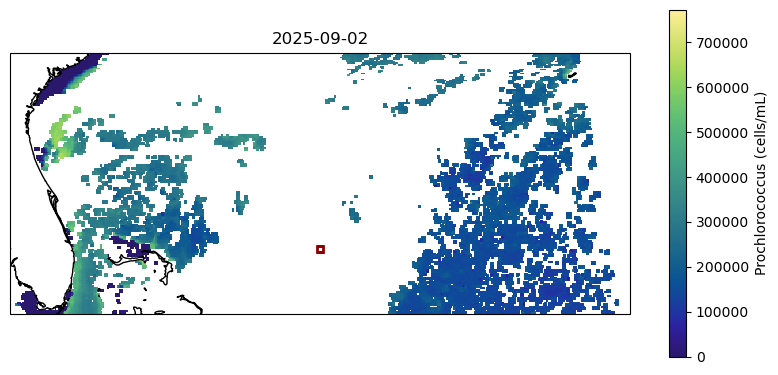

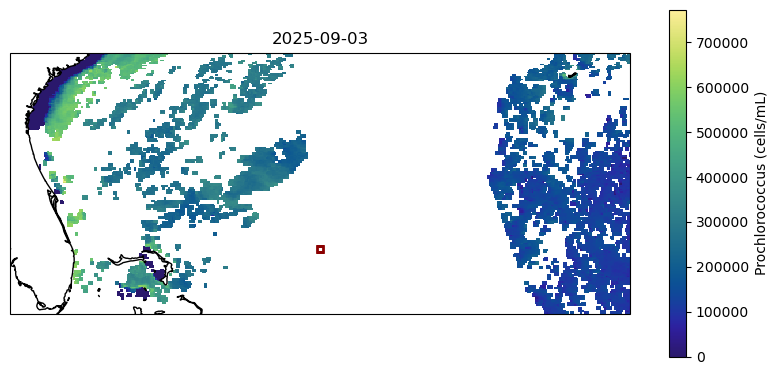

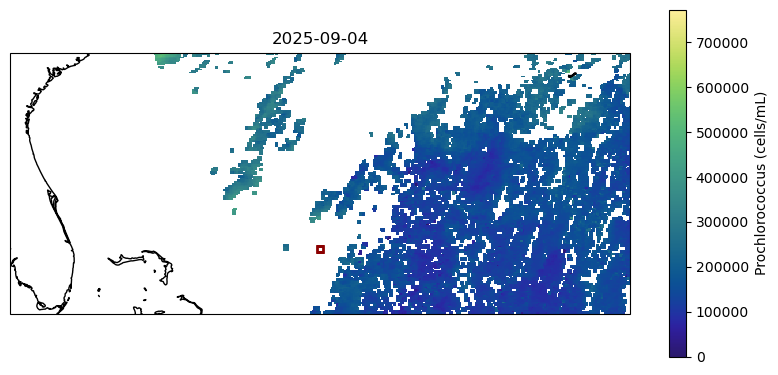

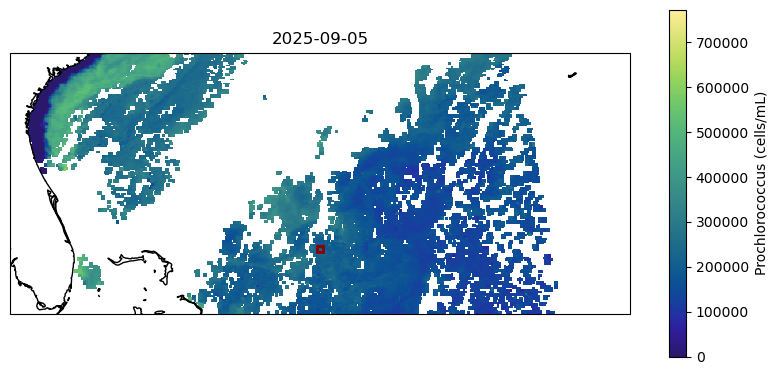

In [26]:
# Define the target lat/lon coordinates
tar_coords_1 = [27, -72.5]

date_str = [str(date) for date in dataset["time"].dt.date.values]
min_val_bbox = dataset["prococcus_moana"].sel(lon=slice(bbox[0], bbox[2]), lat=slice(bbox[3], bbox[1])).min().values
max_val_bbox = dataset["prococcus_moana"].sel(lon=slice(bbox[0], bbox[2]), lat=slice(bbox[3], bbox[1])).max().values

for i, data_slice in enumerate(dataset["prococcus_moana"]):
    fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
    im = data_slice.plot(
        x='lon',
        y='lat',
        cmap=cmocean.cm.haline,
        vmin=min_val_bbox,
        vmax=max_val_bbox,
        extend='neither',
        cbar_kwargs={
            'label': 'Prochlorococcus (cells/mL)',
            'spacing': 'proportional',
            'pad': 0.05,
            'shrink': 0.75,
        },
        ax=ax
    )
    ax.coastlines()
    ax.set_xlim(min_lon, max_lon)
    ax.set_ylim(min_lat, max_lat)
    ax.set_title(f'{date_str[i]}')
    ax.plot(tar_coords_1[1], tar_coords_1[0], 's', markersize=5, label='Target Point', markeredgewidth=2, markerfacecolor='none', markeredgecolor=mcolors.CSS4_COLORS['darkred'])

/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 67.85 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


Text(0.5, 1.0, 'Post (~ 1 Week) Hurricane Mean (8/24 - 9/5)')

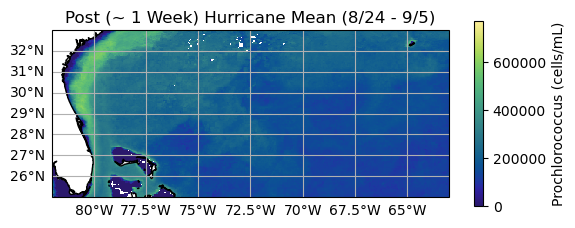

In [27]:
fig,ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()})
ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
plot = dataset['prococcus_moana'].mean("time").plot(x="lon", y="lat", cbar_kwargs={'label': 'Prochlorococcus (cells/mL)', 'shrink':0.5}, cmap=cmocean.cm.haline, extend="neither",vmin=min_val_bbox, vmax=max_val_bbox)
ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)
ax.coastlines()
ax.set_title('Post (~ 1 Week) Hurricane Mean (8/24 - 9/5)')

In [28]:
# Calculate a 3-day running average over time
rolling_3 = dataset.rolling(time=3, center=True, min_periods=1).mean()
rolling_3 = rolling_3.isel(time=slice(1,-1))
#rolling_3_std = dataset.rolling(time=3, center=True, min_periods=1).std()
#rolling_3_std = rolling_3_std.isel(time=slice(1,-1))
rolling_5 = dataset.rolling(time=5, center=True, min_periods=1).mean()
rolling_5 = rolling_5.isel(time=slice(2,-2))
coarsened_2 = dataset.coarsen(time=2, boundary='trim').mean()
#coarsened_2_std = dataset.coarsen(time=2, boundary='trim').std()

# Set time to midnight for each date for the coarsened datasets
# new_times = [np.datetime64(str(t)[:10] + 'T00:00:00') for t in coarsened_2['time'].values]
# coarsened_2 = coarsened_2.assign_coords(time=new_times)
# coarsened_2_std = coarsened_2_std.assign_coords(time=new_times)

# Set time from 
#new_times = [np.datetime64(str(t)[:10] + 'T00:00:00') for t in coarsened_2['time'].values]
new_times = [np.datetime64('2025-08-24T00:00:00') if t == np.datetime64('2025-08-23T12:00:00') else t for t in coarsened_2['time'].values]
coarsened_2 = coarsened_2.assign_coords(time=new_times) 

In [ ]:
# for i, data_slice in enumerate(prococcus_rolling["prococcus_moana"]):
#     fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
#     im = data_slice.plot(
#         x='lon',
#         y='lat',
#         cmap=cmocean.cm.haline,
#         vmin=min_val_bbox,
#         vmax=max_val_bbox,
#         cbar_kwargs={
#             'label': 'Prochlorococcus (cells/mL)',
#             'spacing': 'proportional',
#             'pad': 0.05,
#             'shrink': 0.75,
#         },
#         ax=ax
#     )
#     ax.coastlines()
#     ax.set_xlim(min_lon, max_lon)
#     ax.set_ylim(min_lat, max_lat)
#     # Use the rolling time coordinate for the title
#     #ax.set_title(f'3-day Rolling Avg: {str(prococcus_rolling.time.values[i])[:10]}')
#     plt.show()

/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 67.85 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


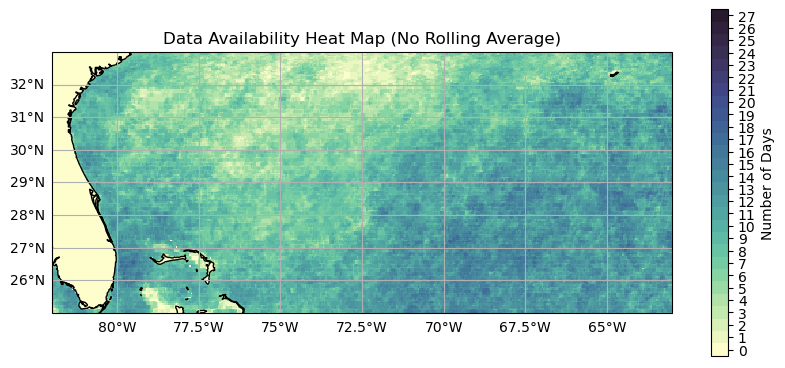

/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 67.94 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


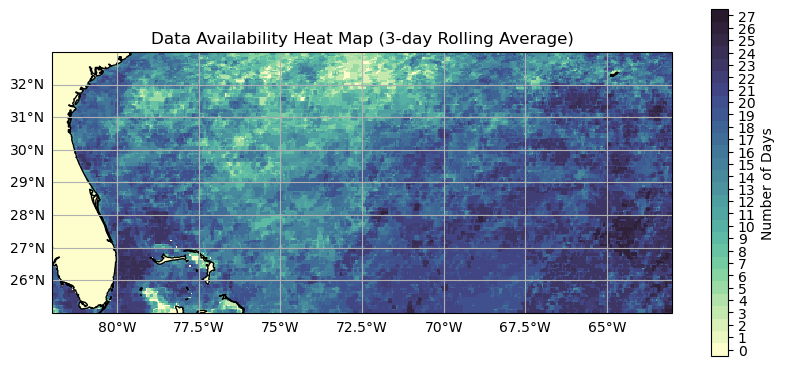

/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 67.91 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


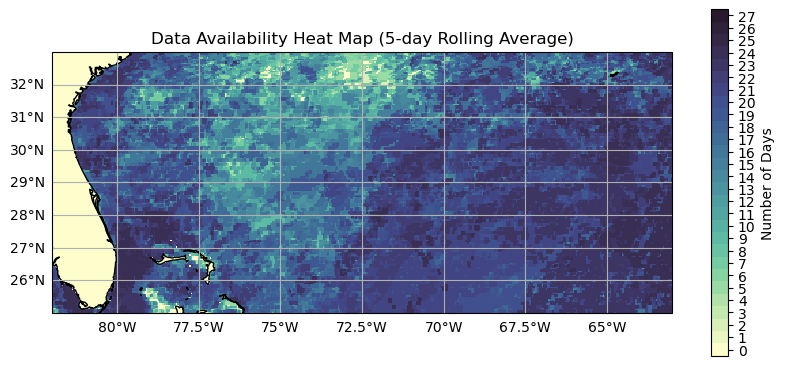

In [29]:
# View data availablility heat map for 1, 3, and 5 day rolling averages
data_count_1 = dataset['prococcus_moana'].count(dim='time')
data_count_3 = rolling_3['prococcus_moana'].count(dim='time')
data_count_5 = rolling_5['prococcus_moana'].count(dim='time')

# Get the total number of days in the 'time' dimension
total_days = len(dataset['time'])

# Create a discrete colormap with `total_days` colors
discrete_cmap = ListedColormap(cmocean.cm.deep(np.linspace(0, 1, total_days)))

# Define boundaries for the colormap
boundaries = np.arange(0, total_days + 1)  # One boundary for each day

# Plot the heat map
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
im = data_count_1.plot(
    x='lon',
    y='lat',
    cmap=discrete_cmap,  # Use the discrete colormap
    cbar_kwargs={
        'label': 'Number of Days',
        'spacing': 'proportional',
        'pad': 0.05,
        'shrink': 0.75
    },
    vmin=0,
    vmax=total_days,  # Set color bar range
    ax=ax
)

# Adjust the colorbar ticks to center them in each bin
cbar = im.colorbar
cbar.set_ticks(boundaries[:-1] + 0.5)  # Center ticks in each bin
cbar.set_ticklabels(boundaries[:-1])  # Set tick labels

# Set the plot extent (xmin, xmax, ymin, ymax)
ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)

ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
ax.coastlines()
ax.set_title('Data Availability Heat Map (No Rolling Average)')
plt.show()

# Plot the heat map
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
im = data_count_3.plot(
    x='lon',
    y='lat',
    cmap=discrete_cmap,  # Use the discrete colormap
    cbar_kwargs={
        'label': 'Number of Days',
        'spacing': 'proportional',
        'pad': 0.05,
        'shrink': 0.75
    },
    vmin=0,
    vmax=total_days,  # Set color bar range
    ax=ax
)

# Adjust the colorbar ticks to center them in each bin
cbar = im.colorbar
cbar.set_ticks(boundaries[:-1] + 0.5)  # Center ticks in each bin
cbar.set_ticklabels(boundaries[:-1])  # Set tick labels

# Set the plot extent (xmin, xmax, ymin, ymax)
ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)

ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
ax.coastlines()
ax.set_title('Data Availability Heat Map (3-day Rolling Average)')
plt.show()

# Plot the heat map
fig, ax = plt.subplots(figsize=(10, 6), subplot_kw={'projection': ccrs.PlateCarree()})
im = data_count_5.plot(
    x='lon',
    y='lat',
    cmap=discrete_cmap,  # Use the discrete colormap
    cbar_kwargs={
        'label': 'Number of Days',
        'spacing': 'proportional',
        'pad': 0.05,
        'shrink': 0.75
    },
    vmin=0,
    vmax=total_days,  # Set color bar range
    ax=ax
)

# Adjust the colorbar ticks to center them in each bin
cbar = im.colorbar
cbar.set_ticks(boundaries[:-1] + 0.5)  # Center ticks in each bin
cbar.set_ticklabels(boundaries[:-1])  # Set tick labels

# Set the plot extent (xmin, xmax, ymin, ymax)
ax.set_xlim(min_lon, max_lon)
ax.set_ylim(min_lat, max_lat)

ax.gridlines(draw_labels={"left": "y", "bottom": "x"})
ax.coastlines()
ax.set_title('Data Availability Heat Map (5-day Rolling Average)')
plt.show()

In [30]:
# Define the target lat/lon coordinates
tar_coords_1 = [27, -72.5]

# Find the nearest point to the target lat/lon coordinates
tar1datanear =  rolling_3.sel(lat=tar_coords_1[0], lon=tar_coords_1[1], method='nearest')

# Determine the index of lat/lon to the target coordinate
tarcoords1_idx = [rolling_3.lat.values.tolist().index(tar1datanear.lat.values), \
                  rolling_3.lon.values.tolist().index(tar1datanear.lon.values)]

# Select adjacent data
tar1_data = rolling_3.isel(lat=slice(tarcoords1_idx[0]-1, tarcoords1_idx[0]+2), \
                                  lon=slice(tarcoords1_idx[1]-1, tarcoords1_idx[1]+2))
tar1_data_std = dataset.isel(lat=slice(tarcoords1_idx[0]-1, tarcoords1_idx[0]+2), \
                                  lon=slice(tarcoords1_idx[1]-1, tarcoords1_idx[1]+2))

# Calculate the mean of the selected adjacent data
tar1_data_mean = tar1_data.mean(dim=['lat','lon'])
tar1_data_std_mean = tar1_data_std.std(dim=['lat','lon'])
tar1_data_std_mean = tar1_data_std_mean.rolling(time=3, center=True, min_periods=1).mean()
tar1_data_std_mean = tar1_data_std_mean.isel(time=slice(1,-1))
#tar1_data_std_mean = tar1_data_std_mean.assign_coords(time=new_times) 




/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 67.93 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 67.85 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/dask/array/numpy_compat.py:57: RuntimeWarning: invalid value en

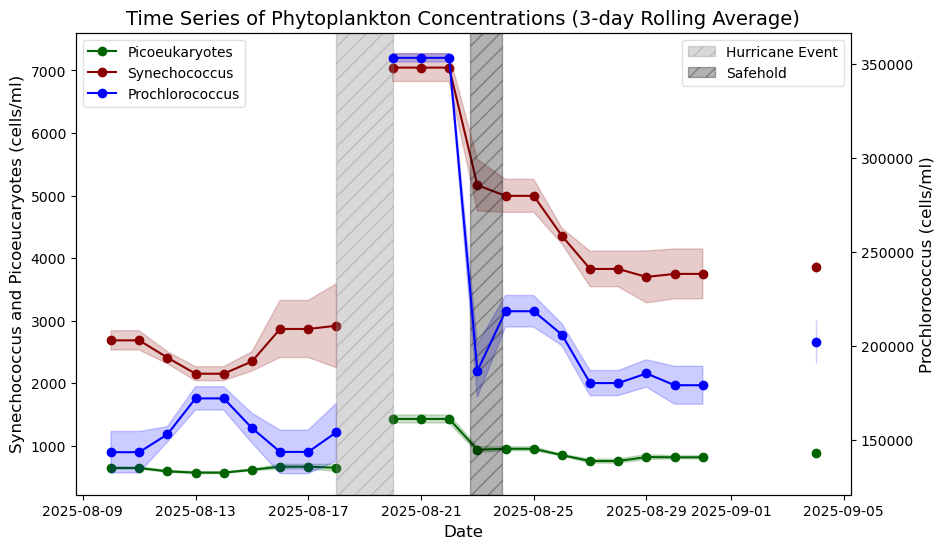

In [31]:
fig, ax = plt.subplots(figsize =(10, 6))
linewidth = 1
markersize = 5
date_str = [str(date) for date in dataset["time"].dt.date.values]

# Extract the time values and chlorophyll concentrations for tar1_data_mean
time_values = tar1_data_mean['time'].values

ax.plot(time_values,
        tar1_data_mean['picoeuk_moana'].values,
        'o-',
        color=mcolors.CSS4_COLORS['darkgreen'],
        label="Picoeukaryotes"
)

ax.fill_between(time_values,
                tar1_data_mean['picoeuk_moana'].values - tar1_data_std_mean['picoeuk_moana'].values,
                tar1_data_mean['picoeuk_moana'].values + tar1_data_std_mean['picoeuk_moana'].values,
                color=mcolors.CSS4_COLORS['darkgreen'],
                alpha=0.2)

ax.plot(time_values,
        tar1_data_mean['syncoccus_moana'].values,
        'o-',
        color=mcolors.CSS4_COLORS['darkred'],
        label="Synechococcus"
)

ax.fill_between(time_values,
                tar1_data_mean['syncoccus_moana'].values - tar1_data_std_mean['syncoccus_moana'].values,
                tar1_data_mean['syncoccus_moana'].values + tar1_data_std_mean['syncoccus_moana'].values,
                color=mcolors.CSS4_COLORS['darkred'],
                alpha=0.2)

ax2 = ax.twinx()  # Create a second y-axis

ax2.plot(time_values,
        tar1_data_mean['prococcus_moana'].values,
        'o-',
        color=mcolors.CSS4_COLORS['blue'],
        label="Prochlorococcus"
)

ax2.fill_between(time_values,
                tar1_data_mean['prococcus_moana'].values - tar1_data_std_mean['prococcus_moana'].values,
                tar1_data_mean['prococcus_moana'].values + tar1_data_std_mean['prococcus_moana'].values,
                color=mcolors.CSS4_COLORS['blue'],
                alpha=0.2)

# Add hurricane event box
ax2.axvspan(np.datetime64('2025-08-18'), np.datetime64('2025-08-20'), color='gray', alpha=0.3, hatch='//', label='Hurricane Event')

# Add safehold event box
ax2.axvspan(np.datetime64('2025-08-22T17:25:00'), np.datetime64('2025-08-23T21:03:00'), color='black', alpha=0.3, hatch='//', label='Safehold')

# Add labels and title
ax.set_title('Time Series of Phytoplankton Concentrations (3-day Rolling Average)', fontsize=14)
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel("Synechococcus and Picoeucaryotes (cells/ml)", fontsize=12)
ax2.set_ylabel("Prochlorococcus (cells/ml)", fontsize=12)

# Create and format legends
handles1, labels1 = ax.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()

ax.legend(handles1 + handles2[0:1], labels1 + labels2[0:1], loc="upper left", frameon=True, framealpha=0.6)
ax2.legend(handles2[1:3],labels2[1:3], loc="upper right", frameon=True, framealpha=0.6)



#ax.legend(loc="upper left", frameon=True, framealpha=0.6)
#ax2.legend(loc="upper right", frameon=True, framealpha=0.6)

In [32]:
# Define the target lat/lon coordinates
tar_coords_1 = [27, -72.5]

# Find the nearest point to the target lat/lon coordinates
tar1datanear =  coarsened_2.sel(lat=tar_coords_1[0], lon=tar_coords_1[1], method='nearest')

# Determine the index of lat/lon to the target coordinate
tarcoords1_idx = [coarsened_2.lat.values.tolist().index(tar1datanear.lat.values), \
                  coarsened_2.lon.values.tolist().index(tar1datanear.lon.values)]

# Select adjacent data
tar1_data = coarsened_2.isel(lat=slice(tarcoords1_idx[0]-2, tarcoords1_idx[0]+3), \
                                  lon=slice(tarcoords1_idx[1]-2, tarcoords1_idx[1]+3))
tar1_data_std = dataset.isel(lat=slice(tarcoords1_idx[0]-2, tarcoords1_idx[0]+3), \
                                  lon=slice(tarcoords1_idx[1]-2, tarcoords1_idx[1]+3))

# Calculate the mean of the selected adjacent data
tar1_data_mean = tar1_data.mean(dim=['lat','lon']) #
tar1_data_std_mean = tar1_data_std.std(dim=['lat','lon'])
tar1_data_std_mean = tar1_data_std_mean.coarsen(time=2, boundary='trim').mean()
tar1_data_std_mean = tar1_data_std_mean.assign_coords(time=new_times) 

/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 67.90 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(
/Users/mkehrli/miniforge3/envs/hackweek/lib/python3.12/site-packages/distributed/client.py:3371: UserWarning: Sending large graph of size 67.85 MiB.
This may cause some slowdown.
Consider loading the data with Dask directly
 or using futures or delayed objects to embed the data into the graph without repetition.
See also https://docs.dask.org/en/stable/best-practices.html#load-data-with-dask for more information.
  warnings.warn(


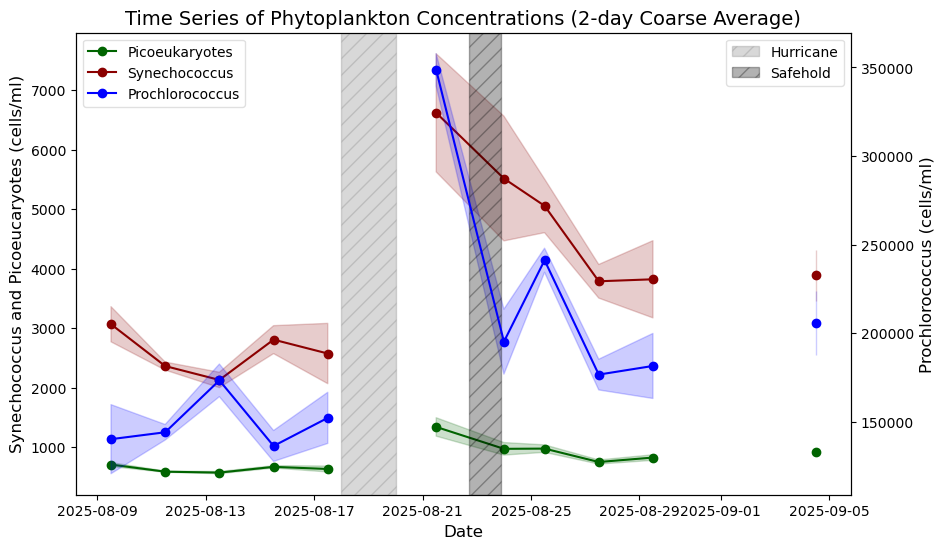

In [33]:
fig, ax = plt.subplots(figsize =(10, 6))
linewidth = 1
markersize = 5
date_str = [str(date) for date in dataset["time"].dt.date.values]

# Extract the time values and chlorophyll concentrations for tar1_data_mean
time_values = tar1_data_mean['time'].values

ax.plot(time_values,
        tar1_data_mean['picoeuk_moana'].values,
        'o-',
        color=mcolors.CSS4_COLORS['darkgreen'],
        label="Picoeukaryotes"
)

ax.fill_between(time_values,
                tar1_data_mean['picoeuk_moana'].values - tar1_data_std_mean['picoeuk_moana'].values,
                tar1_data_mean['picoeuk_moana'].values + tar1_data_std_mean['picoeuk_moana'].values,
                color=mcolors.CSS4_COLORS['darkgreen'],
                alpha=0.2)

ax.plot(time_values,
        tar1_data_mean['syncoccus_moana'].values,
        'o-',
        color=mcolors.CSS4_COLORS['darkred'],
        label="Synechococcus"
)

ax.fill_between(time_values,
                tar1_data_mean['syncoccus_moana'].values - tar1_data_std_mean['syncoccus_moana'].values,
                tar1_data_mean['syncoccus_moana'].values + tar1_data_std_mean['syncoccus_moana'].values,
                color=mcolors.CSS4_COLORS['darkred'],
                alpha=0.2)

ax2 = ax.twinx()  # Create a second y-axis

ax2.plot(time_values,
        tar1_data_mean['prococcus_moana'].values,
        'o-',
        color=mcolors.CSS4_COLORS['blue'],
        label="Prochlorococcus"
)

ax2.fill_between(time_values,
                tar1_data_mean['prococcus_moana'].values - tar1_data_std_mean['prococcus_moana'].values,
                tar1_data_mean['prococcus_moana'].values + tar1_data_std_mean['prococcus_moana'].values,
                color=mcolors.CSS4_COLORS['blue'],
                alpha=0.2)

# Add hurricane event box
ax2.axvspan(np.datetime64('2025-08-18'), np.datetime64('2025-08-20'), color='gray', alpha=0.3, hatch='//', label='Hurricane')

# Add safehold event box
ax2.axvspan(np.datetime64('2025-08-22T17:25:00'), np.datetime64('2025-08-23T21:03:00'), color='black', alpha=0.3, hatch='//', label='Safehold')

# Add labels and title
ax.set_title('Time Series of Phytoplankton Concentrations (2-day Coarse Average)', fontsize=14)
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel("Synechococcus and Picoeucaryotes (cells/ml)", fontsize=12)
ax2.set_ylabel("Prochlorococcus (cells/ml)", fontsize=12)

# Create and format legends
handles1, labels1 = ax.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()

ax.legend(handles1 + handles2[0:1], labels1 + labels2[0:1], loc="upper left", frameon=True, framealpha=0.6)
ax2.legend(handles2[1:3],labels2[1:3], loc="upper right", frameon=True, framealpha=0.6)

In [ ]:
tar1_data_mean

In [ ]:
time_values

In [ ]:
tar1_data_std_mean['picoeuk_moana'].values

In [ ]:
earthaccess.search_datasets(keyword="*")

In [ ]:
alldatasets = earthaccess.search_datasets(keyword="*")

In [ ]:
alldatasets

In [ ]:
alldatasets = earthaccess.search_datasets(keyword="*")
alldatasets[0]['umm']['ShortName']
SNlist = []

for dataset in alldatasets:
    #print(dataset['umm']['ShortName'])
    SNlist.append(dataset['umm']['ShortName'])

CMClist = [file for file in SNlist if 'PACE' in file]

In [ ]:
SNlist2 = [dataset['umm']['ShortName'] for dataset in alldatasets]

In [ ]:
print(CMClist)

In [ ]:
# Test to see if earthaccess can find a specific dataset
short_name = "PACE_OCI_L2_BGC_NRT"
tspan = ('2025-10-16', '2025-10-16')
bbox = (15.854172706604004, 60.854164123535156, 19.979171752929688, 64.97916412353516)          

results = earthaccess.search_data(
                short_name=short_name,
                temporal=tspan,
                bounding_box=bbox,
                version="3.1"
            )

print(results)

In [ ]:
short_names = ['PACE_OCI_L2_SFREFL_NRT', 'PACE_OCI_L2_BGC_NRT', 'PACE_OCI_L2_AOP_NRT']
tspan = ('2025-09-16', '2025-09-16')
bboxes = [(107.52084350585938, 73.35416412353516, 111.64584350585938, 77.47916412353516), (111.68750762939453, 73.35416412353516, 115.81250762939453, 77.47916412353516), (115.85417175292969, 73.35416412353516, 119.97917938232422, 77.47916412353516), (57.52083969116211, 69.1875, 61.64583969116211, 73.3125), (-167.4791717529297, 60.854164123535156, -163.3541717529297, 64.97916412353516), (-71.64582824707031, 60.854164123535156, -67.52082824707031, 64.97916412353516), (-167.4791717529297, 56.6875, -163.3541717529297, 60.8125), (-163.3125, 56.6875, -159.1875, 60.8125), (20.02083969116211, 56.6875, 24.14583969116211, 60.8125), (-134.1458282470703, 52.52083206176758, -130.0208282470703, 56.64583206176758), (-125.8125, 44.1875, -121.6875, 48.3125), (-63.312496185302734, 44.1875, -59.187496185302734, 48.3125), (45.02083969116211, 44.1875, 49.14583969116211, 48.3125), (49.18750762939453, 44.1875, 53.31250762939453, 48.3125), (149.18751525878906, 44.1875, 153.31251525878906, 48.3125), (145.02084350585938, 40.02083206176758, 149.14584350585938, 44.14583206176758), (120.02084350585938, 31.687498092651367, 124.14584350585938, 35.8125), (-92.47916412353516, 27.520832061767578, -88.35416412353516, 31.645832061767578), (120.02084350585938, 27.520832061767578, 124.14584350585938, 31.645832061767578), (-54.979164123535156, 6.687497615814209, -50.854164123535156, 10.812498092651367), (11.687505722045898, -26.645835876464844, 15.812505722045898, -22.520835876464844)]
data_path = '/Users/mkehrli/Documents/GitHub/pace-rapid-response/PRR_OC/Bloom_Detection/data/20250916/L2'

all_results_per_shortname = [[] for _ in short_names]

for bbox in bboxes:
    for i, short_name in enumerate(short_names):
        results = earthaccess.search_data(
            short_name=short_name,
            temporal=tspan,
            bounding_box=bbox,
            version="3.1"
        )
        all_results_per_shortname[i].extend(results)
        
        print(f" Number of granules for {short_name} in bbox {bbox}: {len(results)}")

# Deduplicate by native-id for each product type
unique_results_per_shortname = []
for results in all_results_per_shortname:
    unique = {}
    for result in results:
        unique[result['meta']['native-id']] = result
        print(result['meta']['native-id'])
    unique_results_per_shortname.append(list(unique.values()))

final_results = list(zip(*unique_results_per_shortname))
print("Total unique granules found for each product:")
for short_name, unique in zip(short_names, unique_results_per_shortname):
    print(f"  {short_name}: {len(unique)}")
print(f"Total scenes found: {sum(len(pairs) for pairs in final_results)}")

# Transpose results to get a list for each product
num_products = len(final_results[0])
granule_lists = [[] for _ in range(num_products)]
for pair in final_results:
    for i, granule in enumerate(pair):
        granule_lists[i].append(granule)

# Download or open for each product
file_lists = []
# if not cloud_flag:
#     os.makedirs(local_path, exist_ok=True)
for granules in granule_lists:
    files = earthaccess.download(granules, local_path=data_path)
    file_lists.append(files)

# Zip together the file paths to preserve pairing
final_paths = list(zip(*file_lists))
print('Files Downloaded: ' + str(sum(len(files) for files in file_lists)))
final_paths

In [ ]:
def get_timestamp(result):
    native_id = result['meta']['native-id']
    match = re.search(r'(\d{8}T\d{6})', native_id)
    return match.group(1) if match else None

def match_granules_by_native_id(results_list):
    """Match granules across product types using their native-id timestamp."""
    # Build dictionaries mapping timestamp to granules for each product
    timestamp_dicts = []
    for results in results_list:
        ts_dict = {}
        for result in results:
            ts = get_timestamp(result)
            if ts:
                ts_dict[ts] = result
        timestamp_dicts.append(ts_dict)
    
    # Find intersection of timestamps across all products
    common_timestamps = set(timestamp_dicts[0].keys())
    for ts_dict in timestamp_dicts[1:]:
        common_timestamps &= set(ts_dict.keys())
    
    # Build final matched list
    matched_granules = []
    for ts in sorted(common_timestamps):
        matched_granules.append(
            tuple(ts_dict[ts] for ts_dict in timestamp_dicts)
        )
    
    return matched_granules

short_names = ['PACE_OCI_L2_SFREFL_NRT', 'PACE_OCI_L2_BGC_NRT', 'PACE_OCI_L2_AOP_NRT']
tspan = ('2025-09-16', '2025-09-16')
bboxes = [(107.52084350585938, 73.35416412353516, 111.64584350585938, 77.47916412353516), (111.68750762939453, 73.35416412353516, 115.81250762939453, 77.47916412353516), (115.85417175292969, 73.35416412353516, 119.97917938232422, 77.47916412353516), (57.52083969116211, 69.1875, 61.64583969116211, 73.3125), (-167.4791717529297, 60.854164123535156, -163.3541717529297, 64.97916412353516), (-71.64582824707031, 60.854164123535156, -67.52082824707031, 64.97916412353516), (-167.4791717529297, 56.6875, -163.3541717529297, 60.8125), (-163.3125, 56.6875, -159.1875, 60.8125), (20.02083969116211, 56.6875, 24.14583969116211, 60.8125), (-134.1458282470703, 52.52083206176758, -130.0208282470703, 56.64583206176758), (-125.8125, 44.1875, -121.6875, 48.3125), (-63.312496185302734, 44.1875, -59.187496185302734, 48.3125), (45.02083969116211, 44.1875, 49.14583969116211, 48.3125), (49.18750762939453, 44.1875, 53.31250762939453, 48.3125), (149.18751525878906, 44.1875, 153.31251525878906, 48.3125), (145.02084350585938, 40.02083206176758, 149.14584350585938, 44.14583206176758), (120.02084350585938, 31.687498092651367, 124.14584350585938, 35.8125), (-92.47916412353516, 27.520832061767578, -88.35416412353516, 31.645832061767578), (120.02084350585938, 27.520832061767578, 124.14584350585938, 31.645832061767578), (-54.979164123535156, 6.687497615814209, -50.854164123535156, 10.812498092651367), (11.687505722045898, -26.645835876464844, 15.812505722045898, -22.520835876464844)]
data_path = '/Users/mkehrli/Documents/GitHub/pace-rapid-response/PRR_OC/Bloom_Detection/data/20250916/L2'

all_results_per_shortname = [[] for _ in short_names]

for bbox in bboxes:
    for i, short_name in enumerate(short_names):
        results = earthaccess.search_data(
            short_name=short_name,
            temporal=tspan,
            bounding_box=bbox,
            version="3.1"
        )
        all_results_per_shortname[i].extend(results)
        
        print(f" Number of granules for {short_name} in bbox {bbox}: {len(results)}")

# Deduplicate by native-id for each product type
unique_results_per_shortname = []
for results in all_results_per_shortname:
    unique = {}
    for result in results:
        unique[result['meta']['native-id']] = result
    unique_results_per_shortname.append(list(unique.values()))

# Replace the old zip approach with the matching function
final_results = match_granules_by_native_id(unique_results_per_shortname)

print("Total unique granules found for each product:")
for short_name, unique in zip(short_names, unique_results_per_shortname):
    print(f"  {short_name}: {len(unique)}")
print(f"Total matched granule sets: {len(final_results)}")

# Transpose results to get a list for each product
granule_lists = [[] for _ in range(len(short_names))]
for matched_set in final_results:
    for i, granule in enumerate(matched_set):
        granule_lists[i].append(granule)

# Download or open for each product
file_lists = []
os.makedirs(data_path, exist_ok=True)
for granules in granule_lists:
    files = earthaccess.download(granules, local_path=data_path)
    file_lists.append(files)

# Zip together the file paths to preserve pairing
final_paths = list(zip(*file_lists))
print('Files Downloaded: ' + str(sum(len(files) for files in file_lists)))
final_paths
